# Notebook to analyse the use of Multi-Layer Perceptrons (MLP) for the analysis of FUNcube-1 temperature data.

In [7]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt

from satmad.propagation.tle import TLE
from satmad.propagation.sgp4_propagator import SGP4Propagator
from satmad.coordinates.trajectory import Trajectory
from satmad.utils.timeinterval import TimeInterval
from satmad.utils.interpolators import CartInterpolator3D

from astropy.time import Time
import astropy.units as u
from astropy.coordinates import SkyCoord, GCRS, TEME

import ssa_calc

from alive_progress import alive_bar

# # Defining plotting style:
plt.style.use("dark_background")  # Dark background for plots

mpl.rcParams["grid.color"] = "white"  # Grid color
mpl.rcParams["grid.linestyle"] = "--"  # Grid line style
mpl.rcParams["grid.linewidth"] = 0.5  # Grid line width
mpl.rcParams["grid.alpha"] = 0.5  # Grid transparency

# Setting plt colors:
plt_colors = [
    "tab:blue",
    "tab:orange",
    "plum",
    "orangered",
    "tab:purple",
    "tab:brown",
    "tab:pink",
    "tab:gray",
    "tab:olive",
    "tab:cyan",
]

In [4]:
def get_coords(tle_elem) -> SkyCoord:
    """
    Function to get co-ordinates of the satellite from TLE.
    :param tle_elem: TLE object
    :return: SkyCoord object
    """
    time = Time(tle_elem.epoch, scale="utc", format="jd")
    pv = tle_elem._satrec.sgp4(int(time.value), time.value % 1)
    return SkyCoord(
        x=pv[1][0] * u.km,
        y=pv[1][1] * u.km,
        z=pv[1][2] * u.km,
        v_x=pv[2][0] * u.km / u.s,
        v_y=pv[2][1] * u.km / u.s,
        v_z=pv[2][2] * u.km / u.s,
        representation_type="cartesian",
        frame=TEME,
        obstime=time.isot,
    )


def create_sgp4_trajectory(
    tle_elem, propogation_duration, step_size=100 * u.s
) -> Trajectory:
    """
    Function to create SGP4 propagator.
    :param tle_elem: TLE object
    :param propogation_duration: TimeInterval object
    :param step_size: TimeInterval object
    :return: Trajectory object
    """

    sgp4_propagator = SGP4Propagator(stepsize=step_size)
    interval = TimeInterval(tle_elem.epoch, propogation_duration)
    return sgp4_propagator.gen_trajectory(tle_elem, interval)


def get_closest_tle_elem(tle_elems, time_of_interest, return_index=False):
    """
    Function to get the closest TLE element.
    :param tle_elems: list of TLE elements
    :param time_of_interest: Time object
    :return: TLE object
    :return: index of the closest TLE element
    """
    for i in range(len(tle_elems)):
        if tle_elems[i].epoch.value < time_of_interest.jd:
            tle_elem = tle_elems[i]
        else:
            break
    if return_index:
        return tle_elem, i - 1
    return tle_elem

In [2]:
TELEM_PATH = r"../telemetry-files/funcube-1/wod2016-02-10.csv"
telem_raw_df = pd.read_csv(TELEM_PATH)

TLE_PATH = r"../tle-files/funcube-1-2013-12-03-to-2022-10-23.json"
tle_df = pd.read_json(TLE_PATH, convert_dates=False, precise_float=True)

tle_elems_with_duplicates = np.empty(len(tle_df), dtype=TLE)
for i in range(len(tle_df)):
    tle_elems_with_duplicates[i] = TLE.from_tle(
        tle_df["TLE_LINE1"][i], tle_df["TLE_LINE2"][i], tle_df["TLE_LINE0"][i]
    )

# Removing duplicates from tle_elems_with_duplicates:
tle_elems = np.array(tle_elems_with_duplicates)
delete_count = 0
for i in range(len(tle_elems_with_duplicates) - 1):
    if (
        tle_elems_with_duplicates[i + 1].epoch == tle_elems_with_duplicates[i].epoch
        or tle_elems_with_duplicates[i + 1].epoch - tle_elems_with_duplicates[i].epoch
        < 1 * u.h
    ):
        tle_elems = np.delete(tle_elems, i - delete_count)
        delete_count += 1

In [5]:
begin_time = Time(telem_raw_df["Satellite Date/Time UTC"][0], scale="utc", format="iso")
closest_tle_elem = get_closest_tle_elem(tle_elems, begin_time)
trajectory = create_sgp4_trajectory(
    closest_tle_elem,
    propogation_duration= 2 * u.day,
    step_size= 25 * u.s,
)

In [9]:
coords_df = pd.DataFrame(
    columns=[
        "obstime (iso)",
        "obstime (jd)",
        "x (km)",
        "y (km)",
        "z (km)",
        "v_x (km/s)",
        "v_y (km/s)",
        "v_z (km/s)",
    ],
)
with alive_bar(len(trajectory.coord_list), force_tty=True) as bar:
    for idx, coord in enumerate(trajectory.coord_list):
        coords_df.loc[idx] = [
            coord.obstime.iso,
            coord.obstime.jd,
            coord.x.to(u.km).value,
            coord.y.to(u.km).value,
            coord.z.to(u.km).value,
            coord.v_x.to(u.km / u.s).value,
            coord.v_y.to(u.km / u.s).value,
            coord.v_z.to(u.km / u.s).value,
        ]
        bar()

|████████████████████████████████████████| 6913/6913 [100%] in 33.9s (204.34/s)                                         


In [10]:
import pickle
POS_INTERP_SAVE_PATH = r"../orbit-propagation/interpolators/funcube-1-pos-interpolator-2013-12-03-to-2022-10-23.pkl"
VEL_INTERP_SAVE_PATH = r"../orbit-propagation/interpolators/funcube-1-vel-interpolator-2013-12-03-to-2022-10-23.pkl"

pos_interp = CartInterpolator3D(
    t=coords_df["obstime (jd)"],    # time in jd
    x=coords_df["x (km)"],  # x position in km
    y=coords_df["y (km)"],  # y position in km
    z=coords_df["z (km)"],  # z position in km
    spline_degree=5,    # spline degree for interpolator
)
vel_interp = CartInterpolator3D(
    t=coords_df["obstime (jd)"],    # time in jd
    x=coords_df["v_x (km/s)"],  # x velocity in km/s
    y=coords_df["v_y (km/s)"],  # y velocity in km/s
    z=coords_df["v_z (km/s)"],  # z velocity in km/s
    spline_degree=5,    # spline degree for interpolator
)

with open(POS_INTERP_SAVE_PATH, "wb") as file:
    pickle.dump(pos_interp, file)
with open(VEL_INTERP_SAVE_PATH, "wb") as file:
    pickle.dump(vel_interp, file)

In [11]:
funcube_1 = ssa_calc.Satellite(POS_INTERP_SAVE_PATH, VEL_INTERP_SAVE_PATH)

Loading interpolators from pickle files...
Interpolators loaded.


In [12]:
telem_df = pd.DataFrame(
    columns=[
        "time (utc)",
        "time (jd)",
        "beta (deg)",
        "fe",
        "theta (deg)",
        "theta_T (deg)",
        "black chassis temp (deg C)",
        "silver chassis temp (deg C)",
        "black panel temp (deg C)",
        "silver panel temp (deg C)",
        "solar panel +X temp (deg C)",
        "solar panel -X temp (deg C)",
        "solar panel +Y temp (deg C)",
        "solar panel -Y temp (deg C)",
    ]
)
with alive_bar(len(telem_raw_df), force_tty=True) as bar:
    for i, row in telem_raw_df.iterrows():
        time = Time(row["Satellite Date/Time UTC"], scale="utc", format="iso")
        beta, fe, theta, theta_T = funcube_1.calc_beta_fe_theta(time)
        black_chassis_temp = row["Black Chassis deg. C"]
        silver_chassis_temp = row["Silver Chassis deg. C"]
        black_panel_temp = row["Black Panel deg. C"]
        silver_panel_temp = row["Silver Panel deg. C"]
        solar_panel_X_temp = row["Solar Panel +X deg. C"]
        solar_panel_neg_X_temp = row["Solar Panel -X deg. C"]
        solar_panel_Y_temp = row["Solar Panel +Y deg. C"]
        solar_panel_neg_Y_temp = row["Solar Panel -Y deg. C"]

        telem_df.loc[i] = [
            time.iso,
            time.jd,
            beta.to(u.deg).value,
            fe.value,
            theta.to(u.deg).value,
            theta_T.to(u.deg).value,
            black_chassis_temp,
            silver_chassis_temp,
            black_panel_temp,
            silver_panel_temp,
            solar_panel_X_temp,
            solar_panel_neg_X_temp,
            solar_panel_Y_temp,
            solar_panel_neg_Y_temp,
        ]
        bar()

|████████████████████████████████████████| 1394/1394 [100%] in 24.6s (56.63/s)                                          


In [ ]:
TELEM_SAVE_PATH = r"../telemetry-files/funcube-1/funcube-1-raw-2016-02-04.h5"
telem_df.to_hdf(TELEM_SAVE_PATH, key="telem_raw", mode="w")

In [13]:
# Processing telem_df for constant values:
telem_processed_df = telem_df.copy()
prev_row = telem_df.iloc[0]
for i, row in telem_df.iterrows():
    if i == 0:
        continue
    if row.iloc[6:14].equals(prev_row.iloc[6:14]):
        telem_processed_df.drop(i, inplace=True)
    prev_row = row
        
telem_processed_df = telem_processed_df.reset_index(drop=True)

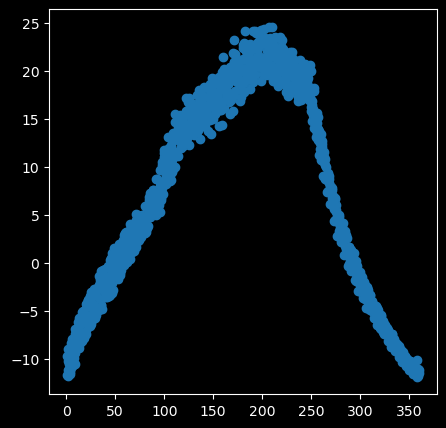

In [14]:
plt.figure(figsize=(5, 5))
plt.scatter(
    telem_processed_df["theta_T (deg)"],
    telem_processed_df["black chassis temp (deg C)"],
    color=plt_colors[0],
)
plt.show()

In [15]:
def create_windows(df, window_size):
    columns = np.concatenate((
        ["theta_T"],
        ["black chassis temp " + str(i) for i in range(window_size)],
        ["silver chassis temp " + str(i) for i in range(window_size)],
        ["black panel temp " + str(i) for i in range(window_size)],
        ["silver panel temp " + str(i) for i in range(window_size)],
        ["black chassis temp " + str(window_size)],
        ["silver chassis temp " + str(window_size)],
        ["black panel temp " + str(window_size)],
        ["silver panel temp " + str(window_size)],
    ))

    windows_df = pd.DataFrame(columns=columns, index=range(len(df) - window_size - 1))
    for i in range(len(df) - window_size - 1):
        windows_df.iloc[i, 0] = df.loc[i + window_size, "theta_T (deg)"]
        windows_df.iloc[i, 1:window_size + 1] = df.loc[i:i + window_size - 1, "black chassis temp (deg C)"]
        windows_df.iloc[i, window_size + 1:2 * window_size + 1] = df.loc[i:i + window_size - 1, "silver chassis temp (deg C)"]
        windows_df.iloc[i, 2 * window_size + 1:3 * window_size + 1] = df.loc[i:i + window_size - 1, "black panel temp (deg C)"]
        windows_df.iloc[i, 3 * window_size + 1:4 * window_size + 1] = df.loc[i:i + window_size - 1, "silver panel temp (deg C)"]
        windows_df.iloc[i, 4 * window_size + 1] = df.loc[i + window_size, "black chassis temp (deg C)"]
        windows_df.iloc[i, 4 * window_size + 2] = df.loc[i + window_size, "silver chassis temp (deg C)"]
        windows_df.iloc[i, 4 * window_size + 3] = df.loc[i + window_size, "black panel temp (deg C)"]
        windows_df.iloc[i, 4 * window_size + 4] = df.loc[i + window_size, "silver panel temp (deg C)"]
    
    train_raw_df = windows_df.iloc[:int(len(windows_df) * 0.8)].reset_index(drop=True)
    test_raw_df = windows_df.iloc[int(len(windows_df) * 0.8):].reset_index(drop=True)

    return windows_df, train_raw_df, test_raw_df


In [16]:
windows_2_step_df, train_raw_2_step_df, test_raw_2_step_df = create_windows(telem_processed_df, 2)
windows_3_step_df, train_raw_3_step_df, test_raw_3_step_df = create_windows(telem_processed_df, 3)
windows_5_step_df, train_raw_5_step_df, test_raw_5_step_df = create_windows(telem_processed_df, 5)
windows_7_step_df, train_raw_7_step_df, test_raw_7_step_df = create_windows(telem_processed_df, 7)
windows_10_step_df, train_raw_10_step_df, test_raw_10_step_df = create_windows(telem_processed_df, 10)
windows_15_step_df, train_raw_15_step_df, test_raw_15_step_df = create_windows(telem_processed_df, 15)
windows_20_step_df, train_raw_20_step_df, test_raw_20_step_df = create_windows(telem_processed_df, 20)
windows_30_step_df, train_raw_30_step_df, test_raw_30_step_df = create_windows(telem_processed_df, 30)
windows_60_step_df, train_raw_60_step_df, test_raw_60_step_df = create_windows(telem_processed_df, 60)

# Normalizing data:
def normalize(df):
    normalized_df = df.copy()
    for column in df.columns:
        if column == "theta_T":
            continue
        normalized_df[column] = (df[column] - df[column].mean()) / df[column].std()
    return normalized_df, df.mean(), df.std()

train_2_step_df, train_2_step_mean, train_2_step_std = normalize(train_raw_2_step_df)
test_2_step_df, test_2_step_mean, test_2_step_std = normalize(test_raw_2_step_df)

train_3_step_df, train_3_step_mean, train_3_step_std = normalize(train_raw_3_step_df)
test_3_step_df, test_3_step_mean, test_3_step_std = normalize(test_raw_3_step_df)

train_5_step_df, train_5_step_mean, train_5_step_std = normalize(train_raw_5_step_df)
test_5_step_df, test_5_step_mean, test_5_step_std = normalize(test_raw_5_step_df)

train_7_step_df, train_7_step_mean, train_7_step_std = normalize(train_raw_7_step_df)
test_7_step_df, test_7_step_mean, test_7_step_std = normalize(test_raw_7_step_df)

train_10_step_df, train_10_step_mean, train_10_step_std = normalize(train_raw_10_step_df)
test_10_step_df, test_10_step_mean, test_10_step_std = normalize(test_raw_10_step_df)

train_15_step_df, train_15_step_mean, train_15_step_std = normalize(train_raw_15_step_df)
test_15_step_df, test_15_step_mean, test_15_step_std = normalize(test_raw_15_step_df)

train_20_step_df, train_20_step_mean, train_20_step_std = normalize(train_raw_20_step_df)
test_20_step_df, test_20_step_mean, test_20_step_std = normalize(test_raw_20_step_df)

train_30_step_df, train_30_step_mean, train_30_step_std = normalize(train_raw_30_step_df)
test_30_step_df, test_30_step_mean, test_30_step_std = normalize(test_raw_30_step_df)

train_60_step_df, train_60_step_mean, train_60_step_std = normalize(train_raw_60_step_df)
test_60_step_df, test_60_step_mean, test_60_step_std = normalize(test_raw_60_step_df)

In [17]:
import tensorflow as tf

x_train = np.empty(shape=(len(train_2_step_df), 1, 2), dtype=np.float32)
y_train = np.empty(shape=(len(train_2_step_df), 1, 1), dtype=np.float32)
for i, row in train_2_step_df.iterrows():
    x_train[i, 0, :] = row.iloc[1:3]
    y_train[i, 0, :] = row.iloc[9]

x_test = np.empty(shape=(len(test_2_step_df), 1, 2), dtype=np.float32)
y_test = np.empty(shape=(len(test_2_step_df), 1, 1), dtype=np.float32)
for i, row in test_2_step_df.iterrows():
    x_test[i, 0, :] = row.iloc[1:3]
    y_test[i, 0, :] = row.iloc[9]
    

model_2_step = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, input_shape=(None, 2), return_sequences=True),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(1)
])


model_2_step.summary()

model_2_step.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.001),
    metrics=tf.keras.metrics.MeanAbsoluteError()
)

2023-05-29 12:22:50.953890: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-29 12:22:51.176690: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-29 12:22:51.177374: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-29 12:22:51.179002: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorF

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, None, 64)          17152     
                                                                 
 lstm_1 (LSTM)               (None, 64)                33024     
                                                                 
 dense (Dense)               (None, 1)                 65        
                                                                 
Total params: 50,241
Trainable params: 50,241
Non-trainable params: 0
_________________________________________________________________


In [18]:
_ = model_2_step.fit(x_train, y_train, epochs=75, validation_data=(x_test, y_test), validation_batch_size=32)

Epoch 1/75


2023-05-29 12:23:02.131194: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8700
2023-05-29 12:23:02.395380: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7fefb4174810 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-05-29 12:23:02.395448: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce GTX 1060, Compute Capability 6.1
2023-05-29 12:23:02.416784: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-05-29 12:23:02.671850: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-05-29 12:23:02.782144: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


30/30 [==============================] - 8s 45ms/step - loss: 0.8671 - mean_absolute_error: 0.8340 - val_loss: 0.6608 - val_mean_absolute_error: 0.7294
Epoch 2/75
30/30 [==============================] - 0s 9ms/step - loss: 0.3809 - mean_absolute_error: 0.5278 - val_loss: 0.0971 - val_mean_absolute_error: 0.2500
Epoch 3/75
30/30 [==============================] - 0s 10ms/step - loss: 0.0548 - mean_absolute_error: 0.1741 - val_loss: 0.0517 - val_mean_absolute_error: 0.1676
Epoch 4/75
30/30 [==============================] - 0s 10ms/step - loss: 0.0411 - mean_absolute_error: 0.1540 - val_loss: 0.0483 - val_mean_absolute_error: 0.1662
Epoch 5/75
30/30 [==============================] - 0s 9ms/step - loss: 0.0406 - mean_absolute_error: 0.1545 - val_loss: 0.0477 - val_mean_absolute_error: 0.1633
Epoch 6/75
30/30 [==============================] - 0s 9ms/step - loss: 0.0402 - mean_absolute_error: 0.1534 - val_loss: 0.0475 - val_mean_absolute_error: 0.1594
Epoch 7/75
30/30 [==================

In [19]:
print(x_test.shape[2])

2


In [20]:
def plot_results(model, test_df, x_test, n_steps, step_start, plt_title):
    # Single step prediction:
    y_pred_single_step = model.predict(x_test[step_start:step_start + n_steps]).flatten()

    # Auto-regressive prediction:
    x_pred_auto = np.empty(shape=(n_steps, 1, x_test.shape[2]), dtype=np.float32)
    y_pred_auto = np.empty(shape=(n_steps, 1, 1), dtype=np.float32)

    x_pred_auto[0, 0, :] = x_test[step_start, 0, :]
    y_pred_auto[0, 0, :] = model.predict(x_pred_auto[0:1, :, :])

    for i in range(1, n_steps):
        x_pred_auto[i, 0, :] = np.concatenate((x_pred_auto[i - 1, 0, 1:], y_pred_auto[i - 1, 0, :]))
        y_pred_auto[i, 0, :] = model.predict(x_pred_auto[i:i+1, :, :])
    
    y_pred_auto = y_pred_auto.flatten()

    # Plot:
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.plot(
        test_df['theta_T'][step_start:step_start + n_steps],
        test_df['black chassis temp 0'][step_start:step_start + n_steps],
        color=plt_colors[0],
        label="Data"
    )
    plt.plot(
        test_df['theta_T'][step_start:step_start + n_steps],
        y_pred_single_step,
        color=plt_colors[1],
        label="Prediction"
    )
    plt.xlabel(r"$\theta_T\;(^\circ)$")
    plt.ylabel(r"Normalized Temperature ($^\circ C$")
    plt.title("Single Step Prediction")
    plt.grid()
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(
        test_df['theta_T'][step_start:step_start + n_steps],
        test_df['black chassis temp 0'][step_start:step_start + n_steps],
        color=plt_colors[0],
        label="Data"
    )
    plt.plot(
        test_df['theta_T'][step_start:step_start + n_steps],
        y_pred_auto,
        color=plt_colors[1],
        label="Prediction"
    )
    plt.xlabel(r"$\theta_T\;(^\circ)$")
    plt.ylabel(r"Normalized Temperature ($^\circ C$")
    plt.title("Auto-Regressive Prediction")
    plt.grid()
    plt.legend()

    plt.suptitle(plt_title)
    plt.show()
    plt.close()



1/1 [==============================] - 0s 28ms/step


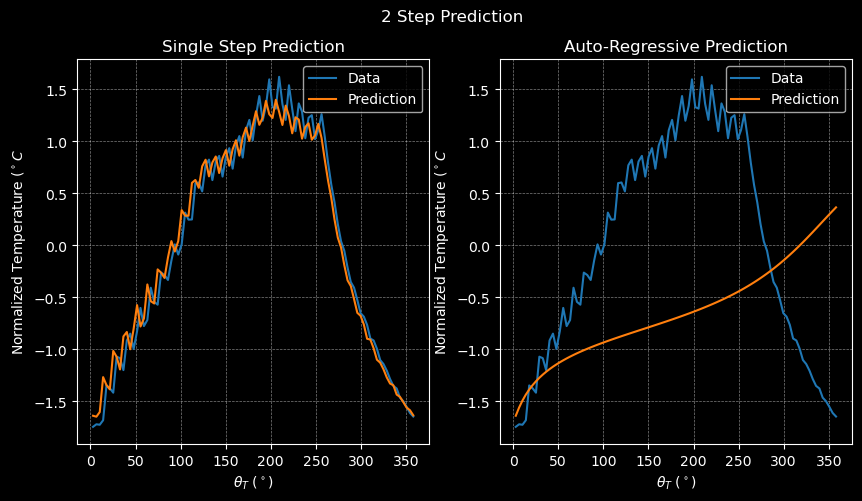

In [21]:
plot_results(model_2_step, test_2_step_df, x_test, 97, 94, "2 Step Prediction")

In [22]:
# 3 step prediction
x_train = np.empty(shape=(len(train_3_step_df), 1, 3), dtype=np.float32)
y_train = np.empty(shape=(len(train_3_step_df), 1, 1), dtype=np.float32)
for i, row in train_3_step_df.iterrows():
    x_train[i, 0, :] = row.iloc[1:4]
    y_train[i, 0, :] = row.iloc[13]

x_test = np.empty(shape=(len(test_3_step_df), 1, 3), dtype=np.float32)
y_test = np.empty(shape=(len(test_3_step_df), 1, 1), dtype=np.float32)
for i, row in test_3_step_df.iterrows():
    x_test[i, 0, :] = row.iloc[1:4]
    y_test[i, 0, :] = row.iloc[13]

model_3_step = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, input_shape=(None, 3), return_sequences=True),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(1)
])

model_3_step.summary()

model_3_step.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.001),
    metrics=tf.keras.metrics.MeanAbsoluteError()
)

_ = model_3_step.fit(x_train, y_train, epochs=300, validation_data=(x_test, y_test), validation_batch_size=32)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, None, 64)          17408     
                                                                 
 lstm_3 (LSTM)               (None, 64)                33024     
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 50,497
Trainable params: 50,497
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
30/30 [==============================] - 7s 55ms/step - loss: 0.8077 - mean_absolute_error: 0.8040 - val_loss: 0.5300 - val_mean_absolute_error: 0.6531
Epoch 2/300
30/30 [==============================] - 0s 11ms/step - loss: 0.2425 - mean_absolute_error: 0.4014 - val_loss: 0.0588 - val_mean_absolute_

1/1 [==============================] - 0s 28ms/step


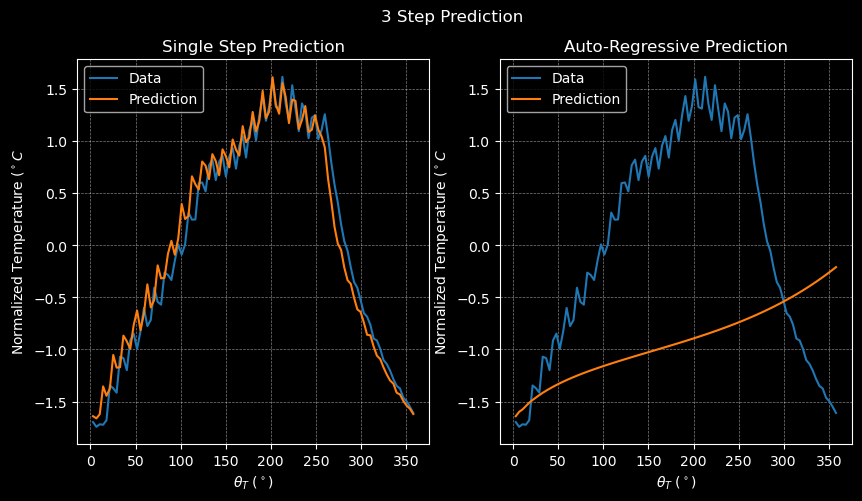

In [23]:
plot_results(model_3_step, test_3_step_df, x_test, 97, 94, "3 Step Prediction")

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, None, 64)          17920     
                                                                 
 lstm_5 (LSTM)               (None, 64)                33024     
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 51,009
Trainable params: 51,009
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
30/30 [==============================] - 6s 43ms/step - loss: 0.7607 - mean_absolute_error: 0.7793 - val_loss: 0.4500 - val_mean_absolute_error: 0.6026
Epoch 2/300
30/30 [==============================] - 0s 9ms/step - loss: 0.1942 - mean_absolute_error: 0.3603 - val_loss: 0.1005 - val_mean_absolute_e

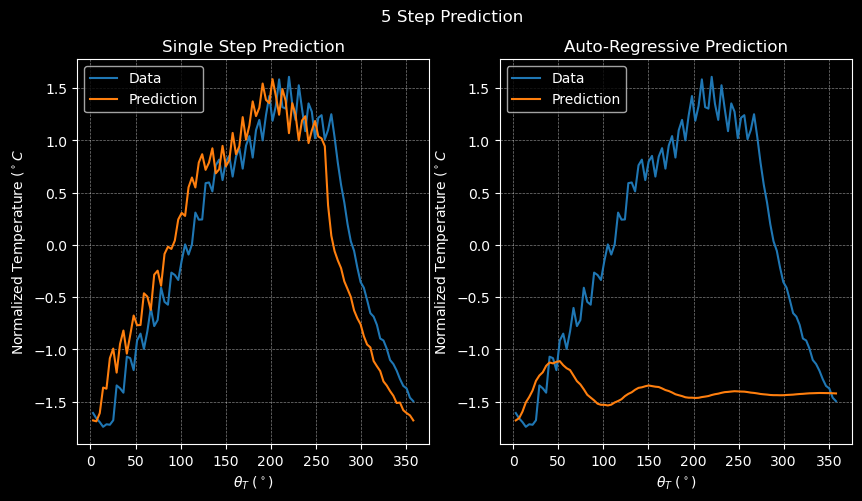

In [24]:
# 5 step prediction
x_train = np.empty(shape=(len(train_5_step_df), 1, 5), dtype=np.float32)
y_train = np.empty(shape=(len(train_5_step_df), 1, 1), dtype=np.float32)
for i, row in train_5_step_df.iterrows():
    x_train[i, 0, :] = row.iloc[1:6]
    y_train[i, 0, :] = row.iloc[21]

x_test = np.empty(shape=(len(test_5_step_df), 1, 5), dtype=np.float32)
y_test = np.empty(shape=(len(test_5_step_df), 1, 1), dtype=np.float32)
for i, row in test_5_step_df.iterrows():
    x_test[i, 0, :] = row.iloc[1:6]
    y_test[i, 0, :] = row.iloc[21]

model_5_step = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, input_shape=(None, 5), return_sequences=True),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(1)
])

model_5_step.summary()

model_5_step.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.001),
    metrics=tf.keras.metrics.MeanAbsoluteError()
)

_ = model_5_step.fit(x_train, y_train, epochs=300, validation_data=(x_test, y_test), validation_batch_size=32)

plot_results(model_5_step, test_5_step_df, x_test, 97, 94, "5 Step Prediction")



In [25]:
# 7 step prediction
x_train = np.empty(shape=(len(train_7_step_df), 1, 7), dtype=np.float32)
y_train = np.empty(shape=(len(train_7_step_df), 1, 1), dtype=np.float32)
for i, row in train_7_step_df.iterrows():
    x_train[i, 0, :] = row.iloc[1:8]
    y_train[i, 0, :] = row.iloc[29]

x_test = np.empty(shape=(len(test_7_step_df), 1, 7), dtype=np.float32)
y_test = np.empty(shape=(len(test_7_step_df), 1, 1), dtype=np.float32)
for i, row in test_7_step_df.iterrows():
    x_test[i, 0, :] = row.iloc[1:8]
    y_test[i, 0, :] = row.iloc[29]

model_7_step = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, input_shape=(None, 7), return_sequences=True),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(1)
])

model_7_step.summary()

model_7_step.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.001),
    metrics=tf.keras.metrics.MeanAbsoluteError()
)

_ = model_7_step.fit(x_train, y_train, epochs=300, validation_data=(x_test, y_test), validation_batch_size=32)



Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, None, 64)          18432     
                                                                 
 lstm_7 (LSTM)               (None, 64)                33024     
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 51,521
Trainable params: 51,521
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
29/29 [==============================] - 6s 57ms/step - loss: 0.7635 - mean_absolute_error: 0.7793 - val_loss: 0.4238 - val_mean_absolute_error: 0.5871
Epoch 2/300
29/29 [==============================] - 0s 8ms/step - loss: 0.1875 - mean_absolute_error: 0.3559 - val_loss: 0.1462 - val_mean_absolute_e

1/1 [==============================] - 0s 29ms/step


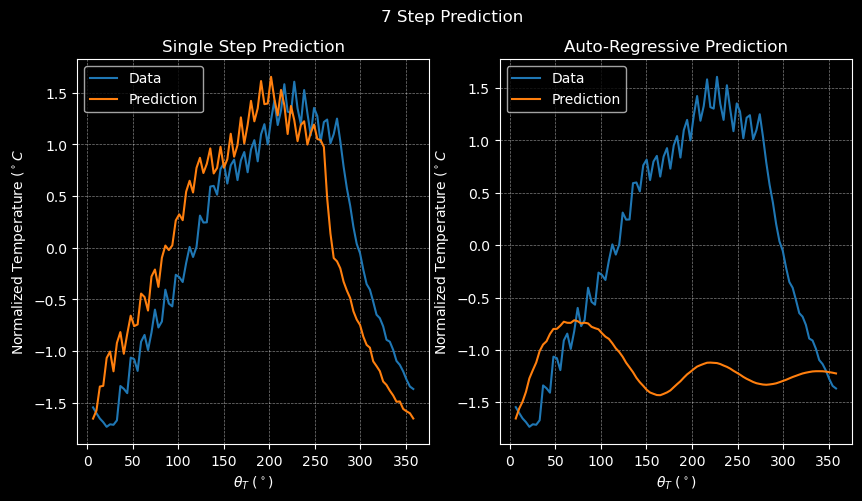

In [26]:
plot_results(model_7_step, test_7_step_df, x_test, 96, 94, "7 Step Prediction")

In [27]:
# 10 step prediction
x_train = np.empty(shape=(len(train_10_step_df), 1, 10), dtype=np.float32)
y_train = np.empty(shape=(len(train_10_step_df), 1, 1), dtype=np.float32)
for i, row in train_10_step_df.iterrows():
    x_train[i, 0, :] = row.iloc[1:11]
    y_train[i, 0, :] = row.iloc[41]

x_test = np.empty(shape=(len(test_10_step_df), 1, 10), dtype=np.float32)
y_test = np.empty(shape=(len(test_10_step_df), 1, 1), dtype=np.float32)
for i, row in test_10_step_df.iterrows():
    x_test[i, 0, :] = row.iloc[1:11]
    y_test[i, 0, :] = row.iloc[41]

model_10_step = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, input_shape=(None, 10), return_sequences=True),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(1)
])

model_10_step.summary()

model_10_step.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.001),
    metrics=tf.keras.metrics.MeanAbsoluteError()
)

_ = model_10_step.fit(x_train, y_train, epochs=300, validation_data=(x_test, y_test), validation_batch_size=32)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, None, 64)          19200     
                                                                 
 lstm_9 (LSTM)               (None, 64)                33024     
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 52,289
Trainable params: 52,289
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
29/29 [==============================] - 6s 49ms/step - loss: 0.7128 - mean_absolute_error: 0.7497 - val_loss: 0.3466 - val_mean_absolute_error: 0.5297
Epoch 2/300
29/29 [==============================] - 0s 10ms/step - loss: 0.1826 - mean_absolute_error: 0.3488 - val_loss: 0.1662 - val_mean_absolute_

1/1 [==============================] - 0s 29ms/step


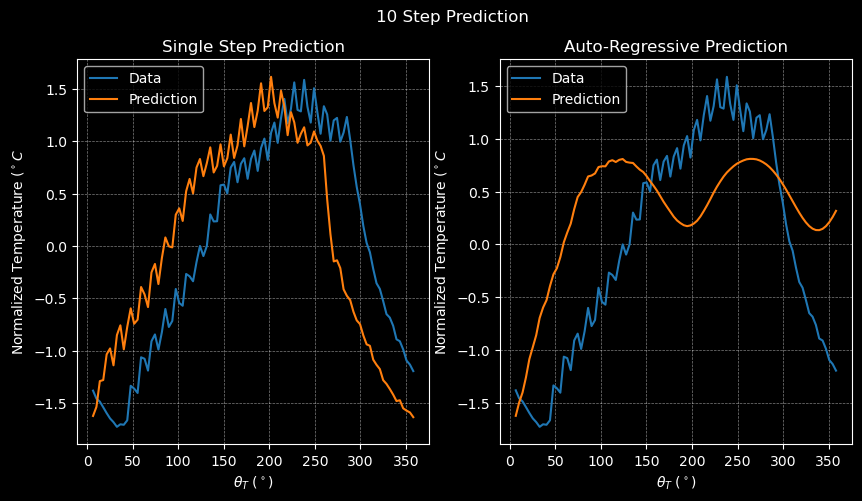

In [28]:
plot_results(model_10_step, test_10_step_df, x_test, 96, 94, "10 Step Prediction")

In [29]:
# 15 step prediction
x_train = np.empty(shape=(len(train_15_step_df), 1, 15), dtype=np.float32)
y_train = np.empty(shape=(len(train_15_step_df), 1, 1), dtype=np.float32)
for i, row in train_15_step_df.iterrows():
    x_train[i, 0, :] = row.iloc[1:16]
    y_train[i, 0, :] = row.iloc[61]

x_test = np.empty(shape=(len(test_15_step_df), 1, 15), dtype=np.float32)
y_test = np.empty(shape=(len(test_15_step_df), 1, 1), dtype=np.float32)
for i, row in test_15_step_df.iterrows():
    x_test[i, 0, :] = row.iloc[1:16]
    y_test[i, 0, :] = row.iloc[61]

model_15_step = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, input_shape=(None, 15), return_sequences=True),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(1)
])

model_15_step.summary()

model_15_step.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.001),
    metrics=tf.keras.metrics.MeanAbsoluteError()
)

_ = model_15_step.fit(x_train, y_train, epochs=300, validation_data=(x_test, y_test), validation_batch_size=32)


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, None, 64)          20480     
                                                                 
 lstm_11 (LSTM)              (None, 64)                33024     
                                                                 
 dense_5 (Dense)             (None, 1)                 65        
                                                                 
Total params: 53,569
Trainable params: 53,569
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
29/29 [==============================] - 7s 53ms/step - loss: 0.6636 - mean_absolute_error: 0.7153 - val_loss: 0.3781 - val_mean_absolute_error: 0.5630
Epoch 2/300
29/29 [==============================] - 0s 9ms/step - loss: 0.2322 - mean_absolute_error: 0.4063 - val_loss: 0.1834 - val_mean_absolute_e

1/1 [==============================] - 0s 37ms/step


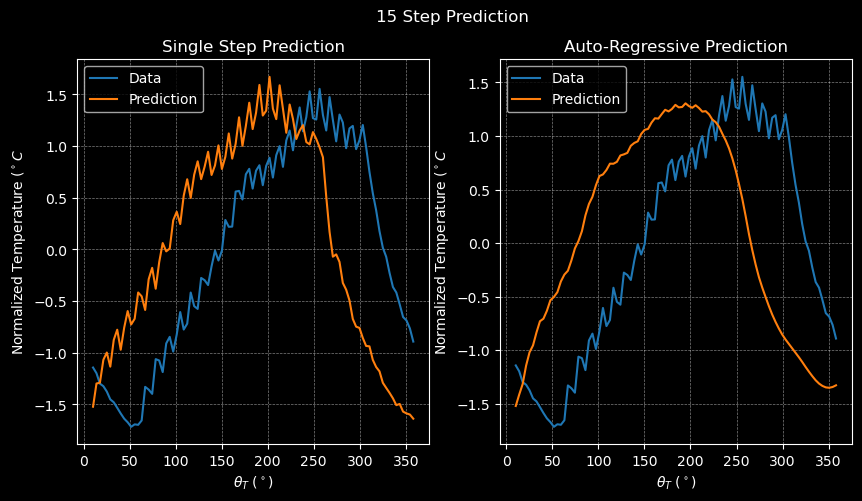

In [30]:
plot_results(model_15_step, test_15_step_df, x_test, 95, 94, "15 Step Prediction")

In [31]:
# 20 step prediction
x_train = np.empty(shape=(len(train_20_step_df), 1, 20), dtype=np.float32)
y_train = np.empty(shape=(len(train_20_step_df), 1, 1), dtype=np.float32)
for i, row in train_20_step_df.iterrows():
    x_train[i, 0, :] = row.iloc[1:21]
    y_train[i, 0, :] = row.iloc[81]

x_test = np.empty(shape=(len(test_20_step_df), 1, 20), dtype=np.float32)
y_test = np.empty(shape=(len(test_20_step_df), 1, 1), dtype=np.float32)
for i, row in test_20_step_df.iterrows():
    x_test[i, 0, :] = row.iloc[1:21]
    y_test[i, 0, :] = row.iloc[81]

model_20_step = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, input_shape=(None, 20), return_sequences=True),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(1)
])

model_20_step.summary()

model_20_step.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.001),
    metrics=tf.keras.metrics.MeanAbsoluteError()
)

_ = model_20_step.fit(x_train, y_train, epochs=300, validation_data=(x_test, y_test), validation_batch_size=32)


Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, None, 64)          21760     
                                                                 
 lstm_13 (LSTM)              (None, 64)                33024     
                                                                 
 dense_6 (Dense)             (None, 1)                 65        
                                                                 
Total params: 54,849
Trainable params: 54,849
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
29/29 [==============================] - 6s 46ms/step - loss: 0.6292 - mean_absolute_error: 0.6972 - val_loss: 0.3608 - val_mean_absolute_error: 0.5374
Epoch 2/300
29/29 [==============================] - 0s 11ms/step - loss: 0.1703 - mean_absolute_error: 0.3317 - val_loss: 0.0855 - val_mean_absolute_

1/1 [==============================] - 0s 28ms/step


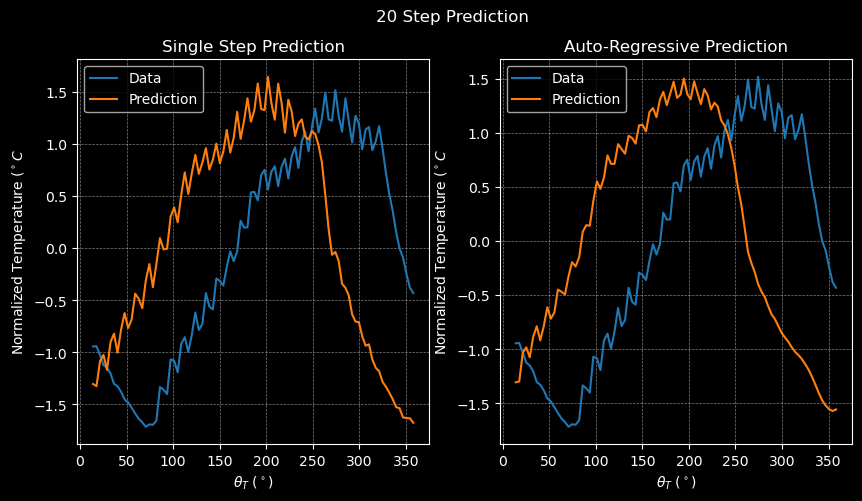

In [32]:
plot_results(model_20_step, test_20_step_df, x_test, 94, 94, "20 Step Prediction")

In [33]:
# 30 step prediction
x_train = np.empty(shape=(len(train_30_step_df), 1, 30), dtype=np.float32)
y_train = np.empty(shape=(len(train_30_step_df), 1, 1), dtype=np.float32)
for i, row in train_30_step_df.iterrows():
    x_train[i, 0, :] = row.iloc[1:31]
    y_train[i, 0, :] = row.iloc[121]

x_test = np.empty(shape=(len(test_30_step_df), 1, 30), dtype=np.float32)
y_test = np.empty(shape=(len(test_30_step_df), 1, 1), dtype=np.float32)
for i, row in test_30_step_df.iterrows():
    x_test[i, 0, :] = row.iloc[1:31]
    y_test[i, 0, :] = row.iloc[121]

model_30_step = tf.keras.Sequential([
    tf.keras.layers.LSTM(64, input_shape=(None, 30), return_sequences=True),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(1)
])

model_30_step.summary()

model_30_step.compile(
    loss=tf.keras.losses.MeanSquaredError(),
    optimizer=tf.keras.optimizers.Adam(0.001),
    metrics=tf.keras.metrics.MeanAbsoluteError()
)

_ = model_30_step.fit(x_train, y_train, epochs=300, validation_data=(x_test, y_test), validation_batch_size=32)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_14 (LSTM)              (None, None, 64)          24320     
                                                                 
 lstm_15 (LSTM)              (None, 64)                33024     
                                                                 
 dense_7 (Dense)             (None, 1)                 65        
                                                                 
Total params: 57,409
Trainable params: 57,409
Non-trainable params: 0
_________________________________________________________________
Epoch 1/300
29/29 [==============================] - 6s 48ms/step - loss: 0.6234 - mean_absolute_error: 0.6944 - val_loss: 0.2670 - val_mean_absolute_error: 0.4413
Epoch 2/300
29/29 [==============================] - 0s 9ms/step - loss: 0.1299 - mean_absolute_error: 0.2490 - val_loss: 0.1182 - val_mean_absolute_e

1/1 [==============================] - 0s 28ms/step


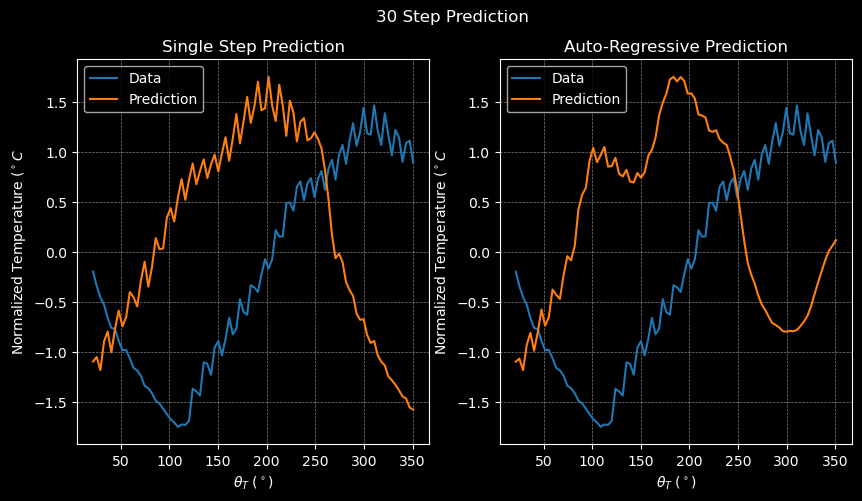

In [34]:
plot_results(model_30_step, test_30_step_df, x_test, 90, 94, "30 Step Prediction")

In [35]:
# Testing anomaly detection on 20 step prediction
begin_index = 942
end_index = 1038
columns = np.concatenate((
    ["theta_T"],
    ["black chassis temp " + str(i) for i in range(0, 21)],
))


test_anomaly_df = pd.DataFrame(
    columns=columns,
    index=range(begin_index, end_index),
)

for i, row in test_anomaly_df.iterrows():
    row["theta_T"] = telem_df.iloc[i+20]["theta_T (deg)"]
    row.iloc[1:] = (telem_df["black chassis temp (deg C)"][i:i+21] - test_20_step_mean["black chassis temp 0"]) / test_20_step_std["black chassis temp 0"]

test_anomaly_df = test_anomaly_df.reset_index(drop=True)



In [36]:
x_test = np.empty(shape=(len(test_anomaly_df), 1, 20), dtype=np.float32)
y_test = test_anomaly_df["black chassis temp 20"].to_numpy()
y_pred = np.empty(shape=(len(test_anomaly_df), 1, 1), dtype=np.float32)

for i, row in test_anomaly_df.iterrows():
    x_test[i, 0, :] = row.iloc[1:21]
    y_pred[i, 0, :] = model_20_step.predict(x_test[i:i+1, :, :])

1/1 [==============================] - 0s 29ms/step


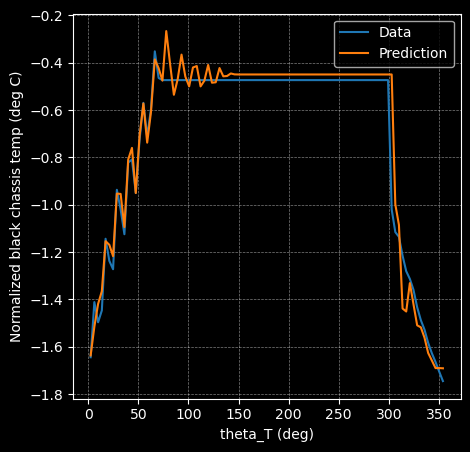

In [37]:
plt.figure(figsize=(5, 5))
plt.plot(
    test_anomaly_df["theta_T"],
    y_test,
    color=plt_colors[0],
    label="Data",
)
plt.plot(test_anomaly_df["theta_T"], y_pred[:, 0, 0], color=plt_colors[1], label="Prediction")
plt.xlabel("theta_T (deg)")
plt.ylabel("Normalized black chassis temp (deg C)")
plt.legend()
plt.grid()
plt.show()

In [1]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import ticker

from alive_progress import alive_bar

from scipy.interpolate import interp1d
from scipy.stats import gaussian_kde

# # Defining plotting style:
plt.style.use("default")  # Dark background for plots

mpl.rcParams["grid.color"] = "grey"  # Grid color
mpl.rcParams["grid.linestyle"] = "--"  # Grid line style
mpl.rcParams["grid.linewidth"] = 0.5  # Grid line width
mpl.rcParams["grid.alpha"] = 0.5  # Grid transparency

# Setting plt colors:
# Setting plt colors to TU Delft colors (order: blue, red, yellow, green and repeating with different shades):
plt_colors = [
    "#006EB7",
    '#A50034',
    "#64A600",
    "#F97306",
    # Darker colors
    '#1A356E',
    "#E60000",
    '#6CC24A',
    '#FFB81C',
    # More darker colors
    "#000D3A",
    "#9A0000",
    "#B14400",
    "#3D5B00",
]

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

# Set random seed for reproducibility:
np.random.seed(42)
tf.random.set_seed(42)
# # Temporary test plot to prevent tensorflow from crashing:
# _ = plt.plot([1, 2, 3], [1, 2, 3], color=plt_colors[0])

2023-06-01 19:22:50.951076: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-01 19:22:53.130723: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory
2023-06-01 19:22:53.130901: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory
2023-06-01 19:22:53.130916: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nv

Num GPUs Available:  1


2023-06-01 19:22:56.599768: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-01 19:22:56.729699: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-01 19:22:56.730309: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [2]:
# Loading the data
telem_path = r"../telemetry-files/funcube-1/funcube-1-telemetry-2016-02-10.h5"
telem_df = pd.read_hdf(
    telem_path,
    "telem",
)
telem_df["illumination"] = telem_df.apply(lambda row: 1 if row["theta_T (deg)"] < (360 * (1 - row["fe"])) else 0, axis=1)


# Processing telem_df for constant values:
telem_processed_df = telem_df.copy()
prev_row = telem_df.iloc[0]
for i, row in telem_df.iterrows():
    if i == 0:
        continue
    if row.iloc[6:14].equals(prev_row.iloc[6:14]):
        telem_processed_df.drop(i, inplace=True)
    prev_row = row
        
telem_processed_df = telem_processed_df.reset_index(drop=True)

telem_processed_df.head()
# Add illumination column:
# telem_processed_df["illumination"] = telem_processed_df.apply(lambda row: 1 if row["theta_T (deg)"] < (360 * (1 - row["fe"])) else 0, axis=1)

,time (utc),time (jd),beta (deg),fe,theta (deg),theta_T (deg),black chassis temperature (deg C),silver chassis temperature (deg C),black panel temperature (deg C),silver panel temperature (deg C),solar panel +X temperature (deg C),solar panel -X temperature (deg C),solar panel +Y temperature (deg C),solar panel -Y temperature (deg C),illumination
0,2016-02-04 00:00:00.000,2.457422e+06,43.419578,0.314142,287.512192,50.966681,1.23,-0.85,-2.10,2.23,3.39,-2.41,-1.40,0.43,1
1,2016-02-04 00:01:00.000,2.457423e+06,43.419238,0.313883,291.258857,54.759942,1.47,1.17,2.75,5.04,0.69,0.92,2.75,-2.91,1
2,2016-02-04 00:02:00.000,2.457423e+06,43.418972,0.313594,295.003917,58.556932,0.00,2.44,7.00,8.09,-1.80,3.84,-0.57,1.89,1
3,2016-02-04 00:03:00.000,2.457423e+06,43.418786,0.313277,298.747190,62.357285,1.68,1.81,4.38,5.67,2.97,0.50,-1.40,3.77,1
4,2016-02-04 00:04:00.000,2.457423e+06,43.418684,0.312933,302.488507,66.160507,3.65,2.77,6.23,6.31,2.14,0.50,3.79,0.22,1


In [3]:
def normalize_temperature(temps, limits=None):
    """
    Function to normalize the temperature data to the range [0, 1].
    :param temps: Temperature data to be normalized.
    :param limits: Limits of the temperature data. If None, the limits are calculated from the data.

    :return: Normalized temperature data.
    """
    
    if limits is None:
        limits = np.array([np.min(temps), np.max(temps)])

    return (temps - limits[0]) / (limits[1] - limits[0])

def denormalize_temperature(temps, limits):
    """
    Function to denormalize the temperature data to the range [0, 1].
    :param temps: Temperature data to be denormalized.
    :param limits: Limits of the temperature data.

    :return: Denormalized temperature data.
    """

    return temps * (limits[1] - limits[0]) + limits[0]

In [82]:
# Function to calculate the kernel density estimate (KDE) of a given dataset:
def kde(data, bins=250, plot_kde=True, labels=None, plt_title=None):
    """
    Function to calculate the kernel density estimate (KDE) of a given dataset.
    :param data: Dataset to be used for the KDE.
    :param bins: Number of bins to be used for the KDE.
    :param plot_kde: Boolean to plot the KDE.
    :param labels: Labels of the KDE plots.

    :return: kde, bin_centers
    """

    kde = np.empty(shape=(data.shape[1], bins), dtype=np.float64)   # array to store the KDE values
    bin_centers = np.empty(shape=(data.shape[1], bins), dtype=np.float64)   # array to store the bin centers
    for i in range(data.shape[1]):
        kde_func = gaussian_kde(data[:, i])  # kernel density estimate function
        bin_centers[i] = np.linspace(np.min(data[:, i]), np.max(data[:, i]), bins)  # bin centers
        kde[i, :] = kde_func(bin_centers[i])    # KDE values

    if plot_kde:
        plt.figure(figsize=(6, 5), tight_layout=True)
        for i in range(data.shape[1]):
            plt.plot(
                bin_centers[i],
                kde[i],
                color=plt_colors[i],
                label=labels[i] if labels is not None else None,
            )

        plt.xlabel(r"Error ($^\circ$C)")
        plt.ylabel(r"Probability density ($^\circ$C$^{-1}$)")
        if plt_title is None:
            plt_title = "Kernel density estimate of the errors"
        plt.title(plt_title)
        plt.legend()
        plt.grid()
        plt.show()

    return kde, bin_centers



def print_kde_stats(data, kde, bin_centers):
    """
    Function to print the mean, standard deviation and area under the KDE curve of a given dataset.
    :param data: Dataset to be used for the KDE.
    :param kde: KDE values.
    :param bin_centers: Bin centers.

    :return: None
    """

    print("Battery:")
    print(f"Mean: {np.mean(data[:, 0]):.2f} degC Std: {np.std(data[:, 0]):.2f} degC (area: {np.trapz(kde[0], bin_centers[0]):.2f})")
    print("Solar panel Yp:")
    print(f"Mean: {np.mean(data[:, 1]):.2f} degC Std: {np.std(data[:, 1]):.2f} degC (area: {np.trapz(kde[1], bin_centers[1]):.2f})")
    print("Solar panel Ym:")
    print(f"Mean: {np.mean(data[:, 2]):.2f} degC Std: {np.std(data[:, 2]):.2f} degC (area: {np.trapz(kde[2], bin_centers[2]):.2f})")
    print("Solar panel Xp:")
    print(f"Mean: {np.mean(data[:, 3]):.2f} degC Std: {np.std(data[:, 3]):.2f} degC (area: {np.trapz(kde[3], bin_centers[3]):.2f})")
    print("Solar panel Xm:")
    print(f"Mean: {np.mean(data[:, 4]):.2f} degC Std: {np.std(data[:, 4]):.2f} degC (area: {np.trapz(kde[4], bin_centers[4]):.2f})")
    print("MCU:")
    print(f"Mean: {np.mean(data[:, 5]):.2f} degC Std: {np.std(data[:, 5]):.2f} degC (area: {np.trapz(kde[5], bin_centers[5]):.2f})")


In [5]:
# Test/train split
train_df = telem_processed_df.iloc[:int(0.8 * len(telem_processed_df))].reset_index(drop=True)
test_df = telem_processed_df.iloc[int(0.8 * len(telem_processed_df)):].reset_index(drop=True)

In [6]:
def plot_model(
    theta_T_vals,
    temp_vals,
    plt_titles=None,
    labels=None,
    colors=None,
    plt_scatter=None,
    linestyles=None,
    limits=None,
    plt_suptitle=None,
):
    """Plots the temperature values of the model.

    Parameters
    ----------
    theta_T_vals : list of numpy.ndarray
        List of theta_T values for each model.
    temp_vals : list of numpy.ndarray
        List of temperature values for each model.
    plt_titles : list of str, optional
        List of titles for each subplot, by default None
    labels : list of str, optional
        List of labels for each model, by default None
    colors : list of mpl colors, optional
        List of colors for each model, by default None
    plt_scatter : list of bool, optional
        List of bools to indicate if the model should be plotted as a scatter plot, by default None
    linestyles : list of str, optional
        List of linestyles for each model, by default None
    limits : list of list of float, optional
        List of limits for each axis, by default None
    plt_suptitle : str, optional
        Title for the figure, by default None
    """

    plt_rows = 2
    plt_cols = 4

    fig, ax = plt.subplots(plt_rows, plt_cols, figsize=(plt_cols * 5, plt_rows * 5))

    for i in range(plt_rows):
        for j in range(plt_cols):
            for k in range(len(theta_T_vals)):
                if plt_scatter[k]:
                    ax[i, j].scatter(
                        theta_T_vals[k],
                        temp_vals[k][:, i * plt_cols + j],
                        label=labels[k] if labels is not None else None,
                        color=colors[k] if colors is not None else plt_colors[k],
                        s=2,
                    )
                else:
                    ax[i, j].plot(
                        theta_T_vals[k],
                        temp_vals[k][:, i * plt_cols + j],
                        label=labels[k] if labels is not None else None,
                        color=colors[k] if colors is not None else plt_colors[k],
                        linestyle=linestyles[k] if linestyles is not None else "-",
                    )

            ax[i, j].set_xlabel(r"$\theta_T$ (deg)")
            ax[i, j].set_ylabel("Temperature (deg C)")
            ax[i, j].set_title(plt_titles[i * plt_cols + j] if plt_titles is not None else None)
            ax[i, j].legend(fontsize=8)
            if limits is not None:
                ax[i, j].set_xlim(limits[0])
                ax[i, j].set_ylim(limits[1])

            ax[i, j].grid()

    if plt_suptitle is not None:
        fig.suptitle(plt_suptitle, fontsize=12)

    return fig, ax

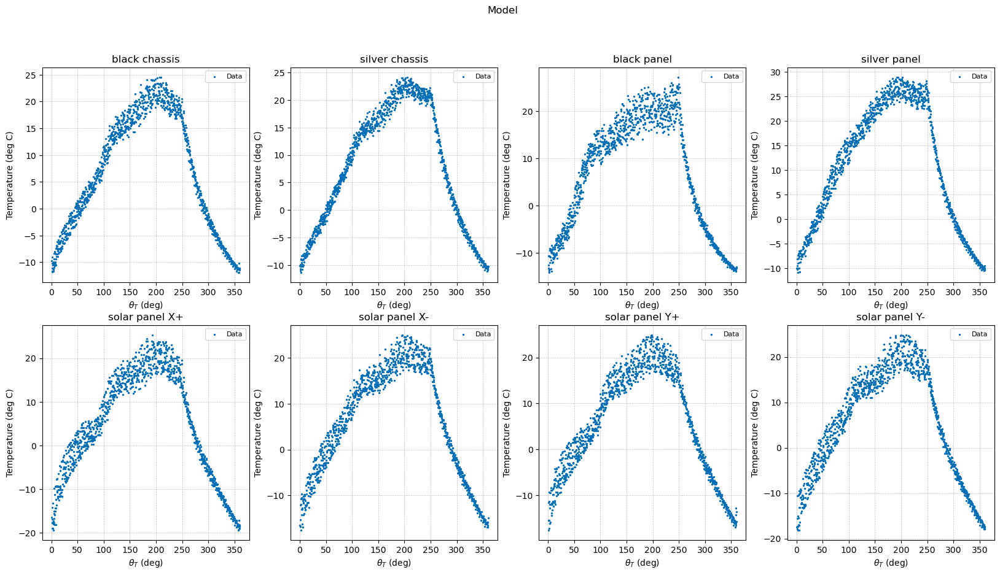

In [7]:
theta_T_vals = [telem_processed_df["theta_T (deg)"]]
temp_vals = [telem_processed_df.iloc[:, 6:-1].to_numpy()]
plt_titles = ["black chassis", "silver chassis", "black panel", "silver panel", "solar panel X+", "solar panel X-", "solar panel Y+", "solar panel Y-"]

fig, ax = plot_model(theta_T_vals, temp_vals, plt_suptitle="Model", plt_scatter=[True], plt_titles=plt_titles, labels=["Data"])

In [8]:
class Model:
    """
    Class to hold the model and its training and testing data.

    :param train_x: Training input data.
    :param train_y: Training output data.
    :param test_x: Testing input data.
    :param test_y: Testing output data.
    :param name: Name of the model.
    :param model: Tensorflow model.
    :param run_device: Device to run the model on.
    :param history: History of the model training.
    """

    def __init__(self, train_x, train_y, test_x, test_y, name=None):
        """
        Initialize the model class.
        :param train_x: Training input data.
        :param train_y: Training output data.
        :param test_x: Testing input data.
        :param test_y: Testing output data.
        :param name: Name of the model.

        :return: None
        """

        self.train_x = train_x
        self.train_y = train_y
        self.test_x = test_x
        self.test_y = test_y
        self.name = name
        self.model = None
        self.run_device = None
        self.history = None


    def create_model(self, layers, optimizer, loss, metrics, input_shape, output_shape):
        """
        Create the model.
        :param layers: List of layers stored as dictionaries with the following keys: type, units, activation.
        :param optimizer: Optimizer function to use for trining.
        :param loss: Loss function to use for training.
        :param metrics: Metrics to use for training.
        :param input_shape: Shape of the input data.
        :param output_shape: Shape of the output data.

        :return: None
        """

        self.model = tf.keras.Sequential(name=self.name)    # create the model
        self.model.add(tf.keras.layers.InputLayer(input_shape=input_shape))   # add the input layer
        self.run_device = "/GPU:0"  # set the device to run the model on

        # Add the layers to the model
        for i, layer in enumerate(layers):
            if layer.get("type") == "LSTM":
                if i < len(layers) - 1:
                    if layers[i + 1].get("type") == "LSTM":
                        self.model.add(
                            tf.keras.layers.LSTM(
                                layer.get("units"),
                                activation=layer.get("activation"),
                                return_sequences=True,
                            )
                        )
                    else:
                        self.model.add(
                            tf.keras.layers.LSTM(
                                layer.get("units"),
                                activation=layer.get("activation"),
                                return_sequences=False,
                            )
                        )
                else:
                    self.model.add(
                        tf.keras.layers.LSTM(
                            layer.get("units"),
                            activation=layer.get("activation"),
                            return_sequences=False,
                        )
                    )
                if layer.get("activation") == "relu":
                    self.run_device = "/CPU:0"  # if the model uses a ReLU activation function, run it on the CPU
            elif layer.get("type") == "Dense":
                self.model.add(
                    tf.keras.layers.Dense(
                        layer.get("units"), activation=layer.get("activation"),
                    )
                )
            else:
                raise ValueError("Invalid layer type")  # raise an error if the layer type is invalid

        self.model.add(tf.keras.layers.Dense(output_shape, activation="linear"))    # add the output layer

        # Compile the model
        self.model.compile(
            optimizer=optimizer,
            loss=loss,
            metrics=[metrics],
        )

    
    def train_model(self, epochs, callbacks=None, batch_size=100, plot_train_history=True, verbose=True):
        """
        Function to train the model.
        :param epochs: Number of epochs to train the model for.
        :param callbacks: Callbacks to use during training.

        :return: None
        """
        if self.test_x is None or self.test_y is None:
            monitor_val_loss = False
        else:
            monitor_val_loss = True
        # Train the model
        with tf.device(self.run_device):
            if monitor_val_loss:
                self.history = self.model.fit(
                    self.train_x,
                    self.train_y,
                    epochs=epochs,
                    batch_size=batch_size,
                    validation_data=(self.test_x, self.test_y),
                    callbacks=[callbacks],
                    verbose=verbose,
                )
            else:
                self.history = self.model.fit(
                    self.train_x,
                    self.train_y,
                    epochs=epochs,
                    batch_size=batch_size,
                    callbacks=[callbacks],
                    verbose=verbose,
                )

        # Plot the training history
        if plot_train_history:
            plt.figure(figsize=(5, 5))
            plt.plot(
                np.linspace(1, len(self.history.history["loss"]), len(self.history.history["loss"])),
                self.history.history["loss"],
                color=plt_colors[0],
                label="Training Loss",
            )
            if monitor_val_loss:
                plt.plot(
                    np.linspace(1, len(self.history.history["loss"]), len(self.history.history["loss"])),
                    self.history.history["val_loss"],
                    color=plt_colors[1],
                    label="Validation Loss",
                )
            plt.xlabel("Epoch")
            plt.ylabel("Loss")
            plt.title(self.name)
            plt.legend()
            plt.grid()
            plt.show()

In [9]:
train_norm_df = train_df.copy()
norm_limits = [np.min(train_norm_df.iloc[:, 6:-1].to_numpy()), np.max(train_norm_df.iloc[:, 6:-1].to_numpy())]
train_norm_df.iloc[:, 6:-1] = normalize_temperature(train_norm_df.iloc[:, 6:-1].to_numpy(), norm_limits)

test_norm_df = test_df.copy()
test_norm_df.iloc[:, 6:-1] = normalize_temperature(test_norm_df.iloc[:, 6:-1].to_numpy(), norm_limits)

In [10]:
def window_data_base(df, window_size, check_continuous=True):
    df = df.copy()
    columns = np.concatenate((
        ["theta_T"],
        ["black panel " + str(i) for i in range(window_size)],
        ["black panel out"]
    ))

    window_df = pd.DataFrame(columns=columns, dtype=np.float64)

    with alive_bar(df.shape[0] - window_size, theme="classic", force_tty=True) as bar:
        for i in range(df.shape[0] - window_size):
            if check_continuous and (df.loc[i+window_size, "time (jd)"] - df.loc[i, "time (jd)"] > 1.25 * (i * 24 * 60)):
                bar()
                continue
            
            window_df.loc[i, "theta_T"] = df.loc[i+window_size, "theta_T (deg)"]
            window_df.loc[i, "black panel 0":"black panel "+str(window_size-1)] = df.loc[i:i+window_size-1, "black panel temperature (deg C)"].to_numpy()
            window_df.loc[i, "black panel out"] = df.loc[i+window_size, "black panel temperature (deg C)"]
            bar()
            
    x = np.zeros((window_df.shape[0], window_size), dtype=np.float64)
    y = np.zeros((window_df.shape[0], 1), dtype=np.float64)
    
    x = window_df.iloc[:, 1:-1].to_numpy()
    y = window_df.iloc[:, -1].to_numpy()
            

    return window_df, x.reshape(-1, window_size, 1), y

In [11]:
def window_data_base_illumination(df, window_size, check_continuous=True):
    df = df.copy()
    columns = np.concatenate((
        ["theta_T"],
        ["illumination " + str(i) for i in range(window_size)],
        ["black panel out"]
    ))

    window_df = pd.DataFrame(columns=columns, dtype=np.float64)

    with alive_bar(df.shape[0] - window_size, theme="classic", force_tty=True) as bar:
        for i in range(df.shape[0] - window_size):
            if check_continuous and (df.loc[i+window_size, "time (jd)"] - df.loc[i, "time (jd)"] > 1.25 * (i * 24 * 60)):
                bar()
                continue
            
            window_df.loc[i, "theta_T"] = df.loc[i+window_size, "theta_T (deg)"]
            window_df.loc[i, "illumination 0":"illumination "+str(window_size-1)] = df.loc[i:i+window_size-1, "illumination"].to_numpy()
            window_df.loc[i, "black panel out"] = df.loc[i+window_size, "black panel temperature (deg C)"]
            bar()
            
    x = np.zeros((window_df.shape[0], window_size), dtype=np.float64)
    y = np.zeros((window_df.shape[0], 1), dtype=np.float64)
    
    x = window_df.iloc[:, 1:-1].to_numpy()
    y = window_df.iloc[:, -1].to_numpy()
            

    return window_df, x.reshape(-1, window_size, 1), y

[========================================] 932/932 [100%] in 1.4s (682.09/s)                                            
[========================================] 232/232 [100%] in 0.4s (744.81/s)                                            
Epoch 1/500
10/10 [==============================] - 28s 387ms/step - loss: 0.3573 - mean_absolute_error: 0.5427 - val_loss: 0.3441 - val_mean_absolute_error: 0.5349
Epoch 2/500
10/10 [==============================] - 0s 25ms/step - loss: 0.3519 - mean_absolute_error: 0.5378 - val_loss: 0.3387 - val_mean_absolute_error: 0.5298
Epoch 3/500
10/10 [==============================] - 0s 24ms/step - loss: 0.3463 - mean_absolute_error: 0.5326 - val_loss: 0.3330 - val_mean_absolute_error: 0.5244
Epoch 4/500
10/10 [==============================] - 0s 23ms/step - loss: 0.3403 - mean_absolute_error: 0.5269 - val_loss: 0.3267 - val_mean_absolute_error: 0.5184
Epoch 5/500
10/10 [==============================] - 0s 23ms/step - loss: 0.3337 - mean_absolute_err

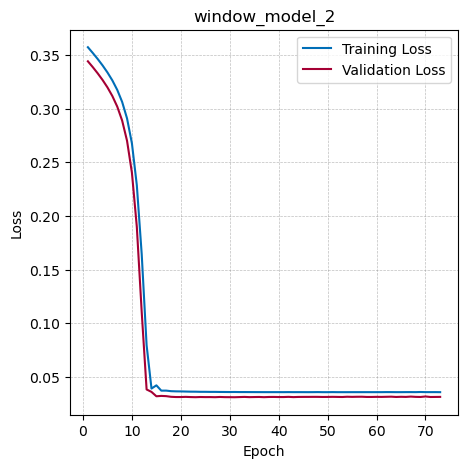

[========================================] 929/929 [100%] in 1.2s (770.78/s)                                            
[========================================] 229/229 [100%] in 0.3s (767.10/s)                                            
Epoch 1/500
10/10 [==============================] - 16s 345ms/step - loss: 0.3554 - mean_absolute_error: 0.5408 - val_loss: 0.3352 - val_mean_absolute_error: 0.5267
Epoch 2/500
10/10 [==============================] - 0s 23ms/step - loss: 0.3442 - mean_absolute_error: 0.5305 - val_loss: 0.3232 - val_mean_absolute_error: 0.5154
Epoch 3/500
10/10 [==============================] - 0s 22ms/step - loss: 0.3307 - mean_absolute_error: 0.5179 - val_loss: 0.3078 - val_mean_absolute_error: 0.5007
Epoch 4/500
10/10 [==============================] - 0s 22ms/step - loss: 0.3121 - mean_absolute_error: 0.5004 - val_loss: 0.2851 - val_mean_absolute_error: 0.4788
Epoch 5/500
10/10 [==============================] - 0s 22ms/step - loss: 0.2829 - mean_absolute_err

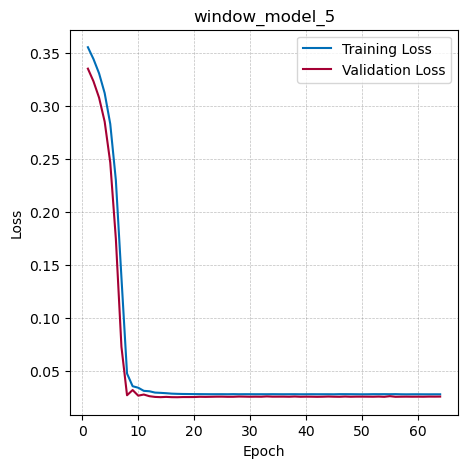

[========================================] 924/924 [100%] in 1.4s (665.56/s)                                            
[========================================] 224/224 [100%] in 0.4s (693.23/s)                                            
Epoch 1/500
10/10 [==============================] - 16s 381ms/step - loss: 0.3442 - mean_absolute_error: 0.5312 - val_loss: 0.3109 - val_mean_absolute_error: 0.5044
Epoch 2/500
10/10 [==============================] - 0s 25ms/step - loss: 0.3030 - mean_absolute_error: 0.4935 - val_loss: 0.2575 - val_mean_absolute_error: 0.4539
Epoch 3/500
10/10 [==============================] - 0s 24ms/step - loss: 0.2295 - mean_absolute_error: 0.4205 - val_loss: 0.1560 - val_mean_absolute_error: 0.3425
Epoch 4/500
10/10 [==============================] - 0s 23ms/step - loss: 0.0987 - mean_absolute_error: 0.2578 - val_loss: 0.0306 - val_mean_absolute_error: 0.1368
Epoch 5/500
10/10 [==============================] - 0s 24ms/step - loss: 0.0278 - mean_absolute_err

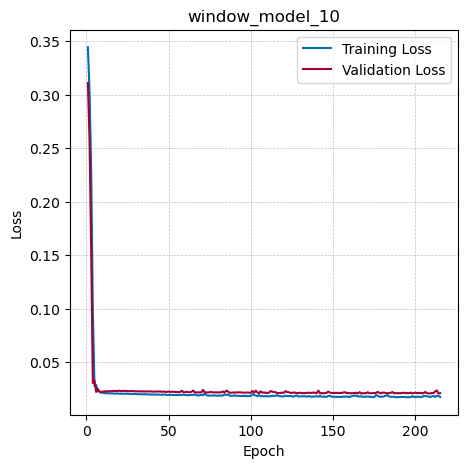

[========================================] 919/919 [100%] in 1.3s (715.95/s)                                            
[========================================] 219/219 [100%] in 0.3s (700.99/s)                                            
Epoch 1/500
10/10 [==============================] - 17s 374ms/step - loss: 0.3320 - mean_absolute_error: 0.5210 - val_loss: 0.2849 - val_mean_absolute_error: 0.4823
Epoch 2/500
10/10 [==============================] - 0s 26ms/step - loss: 0.2441 - mean_absolute_error: 0.4394 - val_loss: 0.1618 - val_mean_absolute_error: 0.3544
Epoch 3/500
10/10 [==============================] - 0s 25ms/step - loss: 0.0888 - mean_absolute_error: 0.2444 - val_loss: 0.0274 - val_mean_absolute_error: 0.1209
Epoch 4/500
10/10 [==============================] - 0s 23ms/step - loss: 0.0332 - mean_absolute_error: 0.1304 - val_loss: 0.0344 - val_mean_absolute_error: 0.1350
Epoch 5/500
10/10 [==============================] - 0s 24ms/step - loss: 0.0262 - mean_absolute_err

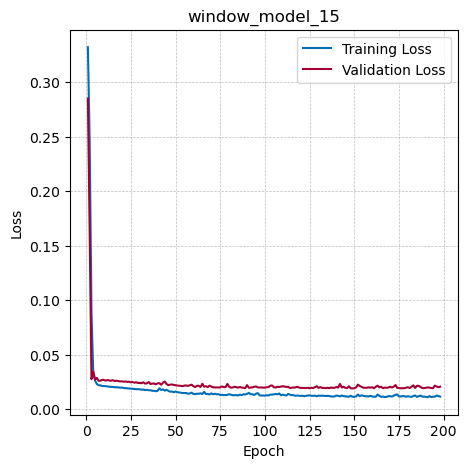

[========================================] 914/914 [100%] in 1.2s (789.03/s)                                            
[========================================] 214/214 [100%] in 0.3s (714.68/s)                                            
Epoch 1/500
10/10 [==============================] - 16s 367ms/step - loss: 0.2980 - mean_absolute_error: 0.4916 - val_loss: 0.2166 - val_mean_absolute_error: 0.4167
Epoch 2/500
10/10 [==============================] - 0s 30ms/step - loss: 0.1290 - mean_absolute_error: 0.3080 - val_loss: 0.0470 - val_mean_absolute_error: 0.1695
Epoch 3/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0348 - mean_absolute_error: 0.1351 - val_loss: 0.0442 - val_mean_absolute_error: 0.1502
Epoch 4/500
10/10 [==============================] - 0s 27ms/step - loss: 0.0334 - mean_absolute_error: 0.1253 - val_loss: 0.0350 - val_mean_absolute_error: 0.1376
Epoch 5/500
10/10 [==============================] - 0s 26ms/step - loss: 0.0281 - mean_absolute_err

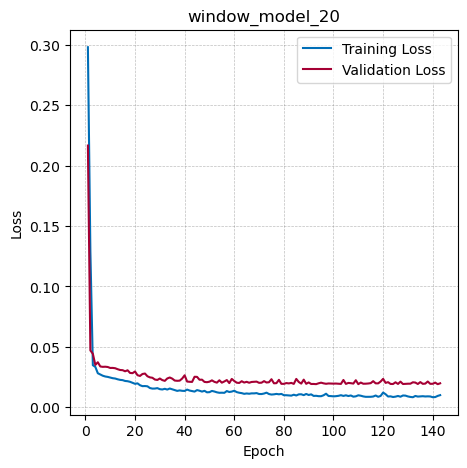

[========================================] 909/909 [100%] in 1.2s (778.31/s)                                            
[========================================] 209/209 [100%] in 0.3s (765.76/s)                                            
Epoch 1/500
10/10 [==============================] - 24s 398ms/step - loss: 0.3206 - mean_absolute_error: 0.5107 - val_loss: 0.2677 - val_mean_absolute_error: 0.4683
Epoch 2/500
10/10 [==============================] - 0s 31ms/step - loss: 0.1841 - mean_absolute_error: 0.3721 - val_loss: 0.0927 - val_mean_absolute_error: 0.2587
Epoch 3/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0466 - mean_absolute_error: 0.1817 - val_loss: 0.0450 - val_mean_absolute_error: 0.1508
Epoch 4/500
10/10 [==============================] - 0s 32ms/step - loss: 0.0474 - mean_absolute_error: 0.1523 - val_loss: 0.0414 - val_mean_absolute_error: 0.1538
Epoch 5/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0422 - mean_absolute_err

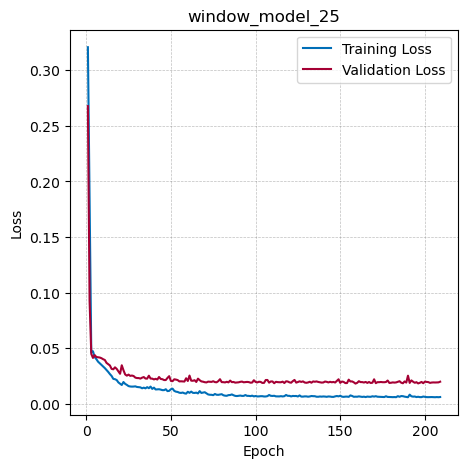

[========================================] 904/904 [100%] in 1.4s (645.80/s)                                            
[========================================] 204/204 [100%] in 0.3s (772.08/s)                                            
Epoch 1/500
10/10 [==============================] - 18s 382ms/step - loss: 0.2798 - mean_absolute_error: 0.4701 - val_loss: 0.1672 - val_mean_absolute_error: 0.3529
Epoch 2/500
10/10 [==============================] - 0s 34ms/step - loss: 0.0795 - mean_absolute_error: 0.2395 - val_loss: 0.0591 - val_mean_absolute_error: 0.1840
Epoch 3/500
10/10 [==============================] - 0s 34ms/step - loss: 0.0588 - mean_absolute_error: 0.1738 - val_loss: 0.0499 - val_mean_absolute_error: 0.1749
Epoch 4/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0423 - mean_absolute_error: 0.1739 - val_loss: 0.0510 - val_mean_absolute_error: 0.1954
Epoch 5/500
10/10 [==============================] - 0s 33ms/step - loss: 0.0398 - mean_absolute_err

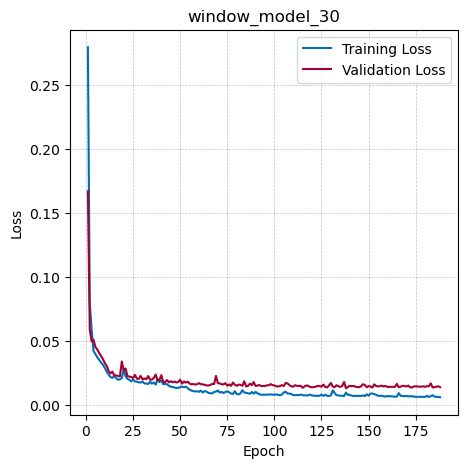

[========================================] 894/894 [100%] in 1.3s (683.98/s)                                            
[========================================] 194/194 [100%] in 0.3s (807.70/s)                                            
Epoch 1/500
9/9 [==============================] - 17s 467ms/step - loss: 0.2579 - mean_absolute_error: 0.4478 - val_loss: 0.1497 - val_mean_absolute_error: 0.3254
Epoch 2/500
9/9 [==============================] - 0s 41ms/step - loss: 0.0799 - mean_absolute_error: 0.2417 - val_loss: 0.0646 - val_mean_absolute_error: 0.2023
Epoch 3/500
9/9 [==============================] - 0s 41ms/step - loss: 0.0610 - mean_absolute_error: 0.1929 - val_loss: 0.0509 - val_mean_absolute_error: 0.1976
Epoch 4/500
9/9 [==============================] - 0s 40ms/step - loss: 0.0481 - mean_absolute_error: 0.1991 - val_loss: 0.0490 - val_mean_absolute_error: 0.2019
Epoch 5/500
9/9 [==============================] - 0s 41ms/step - loss: 0.0445 - mean_absolute_error: 0.1925

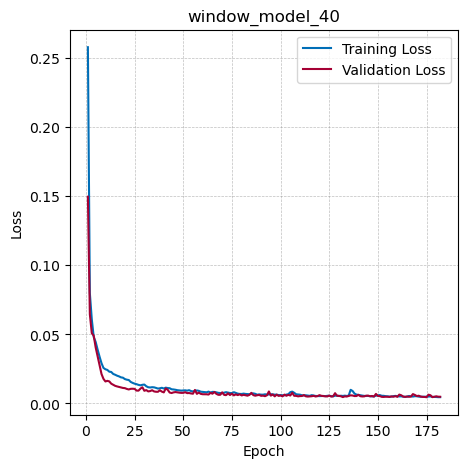

[========================================] 884/884 [100%] in 1.3s (710.07/s)                                            
[========================================] 184/184 [100%] in 0.3s (671.34/s)                                            
Epoch 1/500
9/9 [==============================] - 19s 461ms/step - loss: 0.2384 - mean_absolute_error: 0.4205 - val_loss: 0.1009 - val_mean_absolute_error: 0.2760
Epoch 2/500
9/9 [==============================] - 0s 47ms/step - loss: 0.0710 - mean_absolute_error: 0.2291 - val_loss: 0.0727 - val_mean_absolute_error: 0.2097
Epoch 3/500
9/9 [==============================] - 0s 46ms/step - loss: 0.0622 - mean_absolute_error: 0.2012 - val_loss: 0.0505 - val_mean_absolute_error: 0.2060
Epoch 4/500
9/9 [==============================] - 0s 46ms/step - loss: 0.0520 - mean_absolute_error: 0.2093 - val_loss: 0.0466 - val_mean_absolute_error: 0.1995
Epoch 5/500
9/9 [==============================] - 0s 45ms/step - loss: 0.0469 - mean_absolute_error: 0.1946

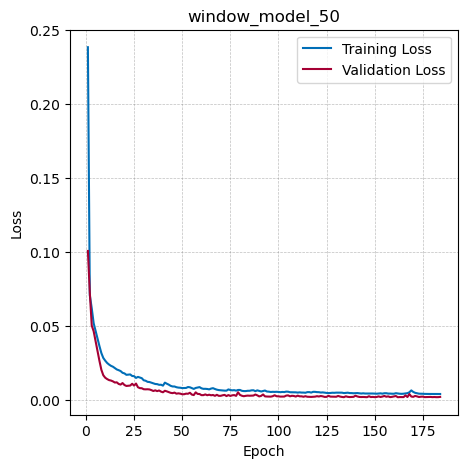

[========================================] 874/874 [100%] in 1.2s (759.29/s)                                            
[========================================] 174/174 [100%] in 0.2s (839.46/s)                                            
Epoch 1/500
9/9 [==============================] - 16s 426ms/step - loss: 0.2879 - mean_absolute_error: 0.4783 - val_loss: 0.1642 - val_mean_absolute_error: 0.3387
Epoch 2/500
9/9 [==============================] - 0s 53ms/step - loss: 0.1016 - mean_absolute_error: 0.2691 - val_loss: 0.0839 - val_mean_absolute_error: 0.2277
Epoch 3/500
9/9 [==============================] - 0s 52ms/step - loss: 0.0661 - mean_absolute_error: 0.2048 - val_loss: 0.0510 - val_mean_absolute_error: 0.2074
Epoch 4/500
9/9 [==============================] - 0s 53ms/step - loss: 0.0550 - mean_absolute_error: 0.2150 - val_loss: 0.0460 - val_mean_absolute_error: 0.1953
Epoch 5/500
9/9 [==============================] - 0s 52ms/step - loss: 0.0478 - mean_absolute_error: 0.1927

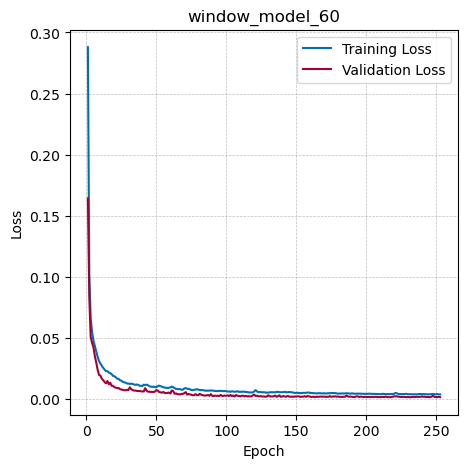

[========================================] 864/864 [100%] in 1.3s (684.45/s)                                            
[========================================] 164/164 [100%] in 0.3s (695.07/s)                                            
Epoch 1/500
9/9 [==============================] - 18s 479ms/step - loss: 0.2905 - mean_absolute_error: 0.4788 - val_loss: 0.1537 - val_mean_absolute_error: 0.3231
Epoch 2/500
9/9 [==============================] - 1s 58ms/step - loss: 0.0986 - mean_absolute_error: 0.2684 - val_loss: 0.0686 - val_mean_absolute_error: 0.2257
Epoch 3/500
9/9 [==============================] - 1s 59ms/step - loss: 0.0662 - mean_absolute_error: 0.2080 - val_loss: 0.0651 - val_mean_absolute_error: 0.2169
Epoch 4/500
9/9 [==============================] - 1s 59ms/step - loss: 0.0571 - mean_absolute_error: 0.2118 - val_loss: 0.0520 - val_mean_absolute_error: 0.2073
Epoch 5/500
9/9 [==============================] - 1s 59ms/step - loss: 0.0527 - mean_absolute_error: 0.2076

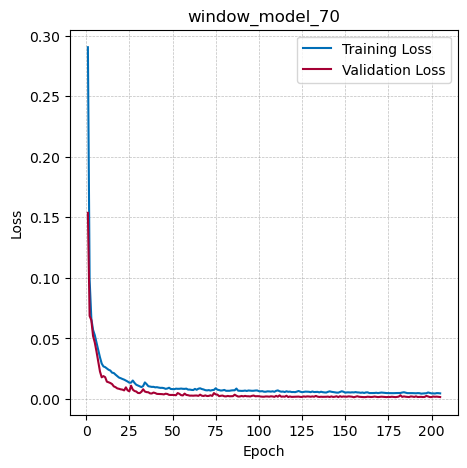

[========================================] 854/854 [100%] in 1.3s (647.54/s)                                            
[========================================] 154/154 [100%] in 0.2s (725.24/s)                                            
Epoch 1/500
9/9 [==============================] - 17s 451ms/step - loss: 0.2812 - mean_absolute_error: 0.4699 - val_loss: 0.1380 - val_mean_absolute_error: 0.3134
Epoch 2/500
9/9 [==============================] - 1s 65ms/step - loss: 0.0851 - mean_absolute_error: 0.2493 - val_loss: 0.0746 - val_mean_absolute_error: 0.2073
Epoch 3/500
9/9 [==============================] - 1s 64ms/step - loss: 0.0634 - mean_absolute_error: 0.1948 - val_loss: 0.0516 - val_mean_absolute_error: 0.2053
Epoch 4/500
9/9 [==============================] - 1s 64ms/step - loss: 0.0549 - mean_absolute_error: 0.2145 - val_loss: 0.0493 - val_mean_absolute_error: 0.2050
Epoch 5/500
9/9 [==============================] - 1s 64ms/step - loss: 0.0500 - mean_absolute_error: 0.2011

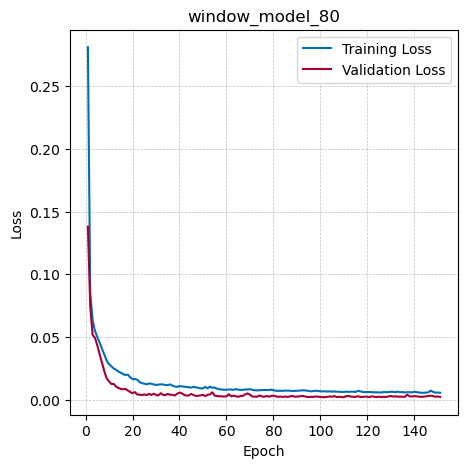

[========================================] 844/844 [100%] in 1.2s (697.62/s)                                            
[========================================] 144/144 [100%] in 0.3s (577.91/s)                                            
Epoch 1/500
9/9 [==============================] - 19s 471ms/step - loss: 0.2716 - mean_absolute_error: 0.4597 - val_loss: 0.1417 - val_mean_absolute_error: 0.3237
Epoch 2/500
9/9 [==============================] - 1s 69ms/step - loss: 0.0853 - mean_absolute_error: 0.2528 - val_loss: 0.0635 - val_mean_absolute_error: 0.2023
Epoch 3/500
9/9 [==============================] - 1s 70ms/step - loss: 0.0685 - mean_absolute_error: 0.2128 - val_loss: 0.0515 - val_mean_absolute_error: 0.1980
Epoch 4/500
9/9 [==============================] - 1s 70ms/step - loss: 0.0575 - mean_absolute_error: 0.2179 - val_loss: 0.0480 - val_mean_absolute_error: 0.1995
Epoch 5/500
9/9 [==============================] - 1s 70ms/step - loss: 0.0536 - mean_absolute_error: 0.2112

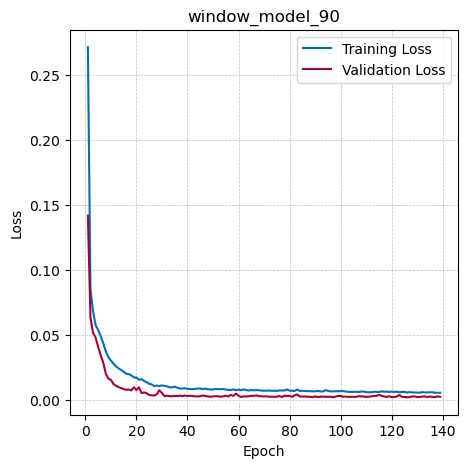

[========================================] 840/840 [100%] in 1.2s (723.23/s)                                            
[========================================] 140/140 [100%] in 0.2s (836.62/s)                                            
Epoch 1/500
9/9 [==============================] - 16s 437ms/step - loss: 0.2874 - mean_absolute_error: 0.4748 - val_loss: 0.1631 - val_mean_absolute_error: 0.3518
Epoch 2/500
9/9 [==============================] - 1s 70ms/step - loss: 0.0910 - mean_absolute_error: 0.2602 - val_loss: 0.0566 - val_mean_absolute_error: 0.1935
Epoch 3/500
9/9 [==============================] - 1s 70ms/step - loss: 0.0701 - mean_absolute_error: 0.2131 - val_loss: 0.0503 - val_mean_absolute_error: 0.1967
Epoch 4/500
9/9 [==============================] - 1s 71ms/step - loss: 0.0585 - mean_absolute_error: 0.2175 - val_loss: 0.0475 - val_mean_absolute_error: 0.1977
Epoch 5/500
9/9 [==============================] - 1s 70ms/step - loss: 0.0550 - mean_absolute_error: 0.2134

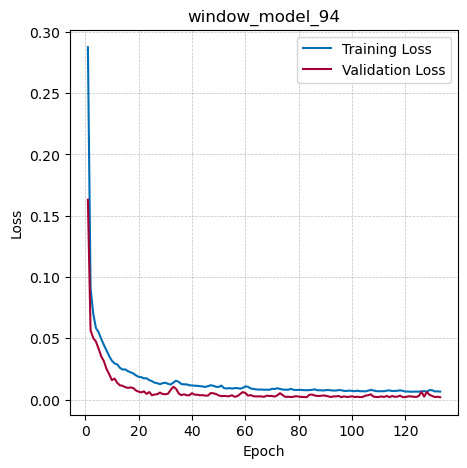

[========================================] 839/839 [100%] in 1.1s (769.80/s)                                            
[========================================] 139/139 [100%] in 0.2s (848.75/s)                                            
Epoch 1/500
9/9 [==============================] - 16s 421ms/step - loss: 0.2945 - mean_absolute_error: 0.4824 - val_loss: 0.1726 - val_mean_absolute_error: 0.3634
Epoch 2/500
9/9 [==============================] - 1s 72ms/step - loss: 0.0894 - mean_absolute_error: 0.2522 - val_loss: 0.0685 - val_mean_absolute_error: 0.1860
Epoch 3/500
9/9 [==============================] - 1s 71ms/step - loss: 0.0752 - mean_absolute_error: 0.2093 - val_loss: 0.0460 - val_mean_absolute_error: 0.1966
Epoch 4/500
9/9 [==============================] - 1s 70ms/step - loss: 0.0546 - mean_absolute_error: 0.2150 - val_loss: 0.0468 - val_mean_absolute_error: 0.1998
Epoch 5/500
9/9 [==============================] - 1s 71ms/step - loss: 0.0492 - mean_absolute_error: 0.1998

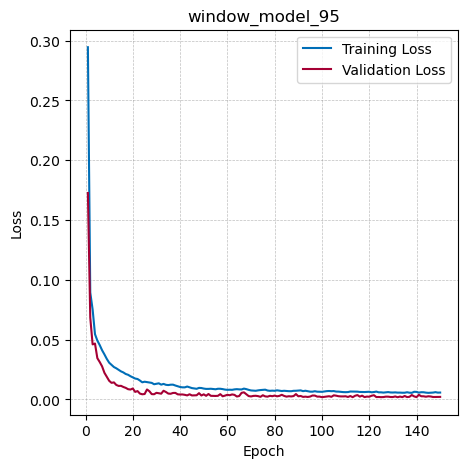

[========================================] 838/838 [100%] in 1.2s (679.34/s)                                            
[========================================] 138/138 [100%] in 0.2s (691.75/s)                                            
Epoch 1/500
9/9 [==============================] - 17s 452ms/step - loss: 0.2853 - mean_absolute_error: 0.4715 - val_loss: 0.1501 - val_mean_absolute_error: 0.3393
Epoch 2/500
9/9 [==============================] - 1s 75ms/step - loss: 0.0832 - mean_absolute_error: 0.2391 - val_loss: 0.0607 - val_mean_absolute_error: 0.1726
Epoch 3/500
9/9 [==============================] - 1s 75ms/step - loss: 0.0639 - mean_absolute_error: 0.1999 - val_loss: 0.0460 - val_mean_absolute_error: 0.1981
Epoch 4/500
9/9 [==============================] - 1s 75ms/step - loss: 0.0529 - mean_absolute_error: 0.2119 - val_loss: 0.0394 - val_mean_absolute_error: 0.1822
Epoch 5/500
9/9 [==============================] - 1s 78ms/step - loss: 0.0452 - mean_absolute_error: 0.1855

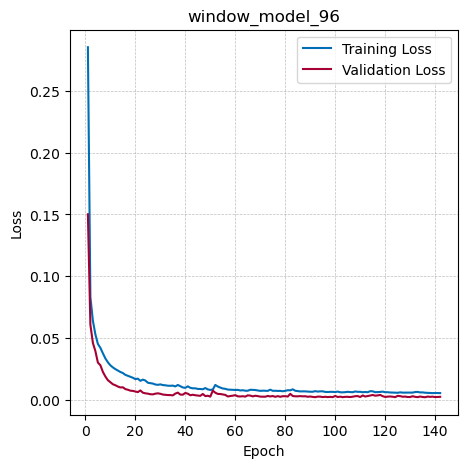

[========================================] 837/837 [100%] in 1.5s (575.84/s)                                            
[========================================] 137/137 [100%] in 0.2s (596.32/s)                                            
Epoch 1/500
9/9 [==============================] - 17s 468ms/step - loss: 0.2376 - mean_absolute_error: 0.4231 - val_loss: 0.1013 - val_mean_absolute_error: 0.2853
Epoch 2/500
9/9 [==============================] - 1s 76ms/step - loss: 0.0687 - mean_absolute_error: 0.2260 - val_loss: 0.0540 - val_mean_absolute_error: 0.1779
Epoch 3/500
9/9 [==============================] - 1s 75ms/step - loss: 0.0613 - mean_absolute_error: 0.2060 - val_loss: 0.0448 - val_mean_absolute_error: 0.1907
Epoch 4/500
9/9 [==============================] - 1s 77ms/step - loss: 0.0554 - mean_absolute_error: 0.2144 - val_loss: 0.0407 - val_mean_absolute_error: 0.1811
Epoch 5/500
9/9 [==============================] - 1s 75ms/step - loss: 0.0500 - mean_absolute_error: 0.1996

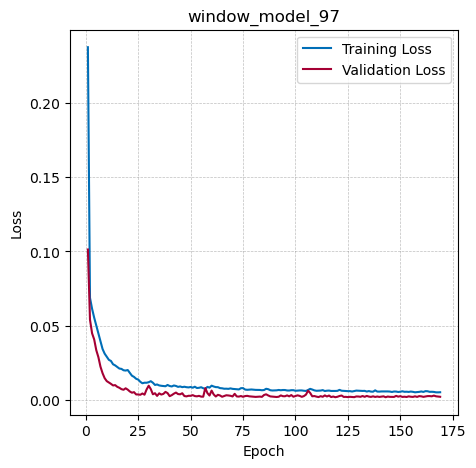

[========================================] 834/834 [100%] in 1.1s (752.79/s)                                            
[========================================] 134/134 [100%] in 0.2s (671.18/s)                                            
Epoch 1/500
9/9 [==============================] - 18s 426ms/step - loss: 0.2455 - mean_absolute_error: 0.4303 - val_loss: 0.0977 - val_mean_absolute_error: 0.2850
Epoch 2/500
9/9 [==============================] - 1s 75ms/step - loss: 0.0775 - mean_absolute_error: 0.2250 - val_loss: 0.0512 - val_mean_absolute_error: 0.1727
Epoch 3/500
9/9 [==============================] - 1s 73ms/step - loss: 0.0562 - mean_absolute_error: 0.2042 - val_loss: 0.0531 - val_mean_absolute_error: 0.2147
Epoch 4/500
9/9 [==============================] - 1s 74ms/step - loss: 0.0529 - mean_absolute_error: 0.2121 - val_loss: 0.0387 - val_mean_absolute_error: 0.1804
Epoch 5/500
9/9 [==============================] - 1s 75ms/step - loss: 0.0468 - mean_absolute_error: 0.1851

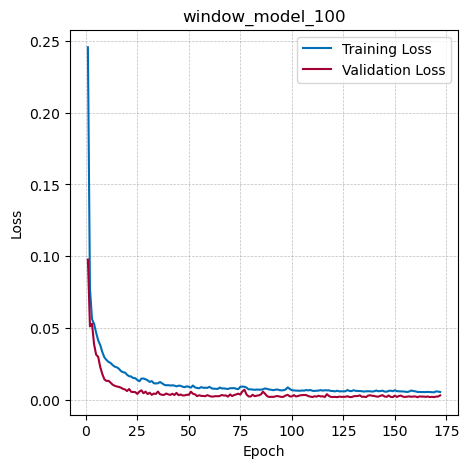

[========================================] 824/824 [100%] in 1.1s (750.61/s)                                            
[========================================] 124/124 [100%] in 0.2s (848.69/s)                                            
Epoch 1/500
9/9 [==============================] - 16s 436ms/step - loss: 0.2183 - mean_absolute_error: 0.4018 - val_loss: 0.0690 - val_mean_absolute_error: 0.2466
Epoch 2/500
9/9 [==============================] - 1s 80ms/step - loss: 0.0732 - mean_absolute_error: 0.2100 - val_loss: 0.0480 - val_mean_absolute_error: 0.1897
Epoch 3/500
9/9 [==============================] - 1s 79ms/step - loss: 0.0560 - mean_absolute_error: 0.2129 - val_loss: 0.0550 - val_mean_absolute_error: 0.2200
Epoch 4/500
9/9 [==============================] - 1s 81ms/step - loss: 0.0490 - mean_absolute_error: 0.2004 - val_loss: 0.0350 - val_mean_absolute_error: 0.1641
Epoch 5/500
9/9 [==============================] - 1s 80ms/step - loss: 0.0434 - mean_absolute_error: 0.1779

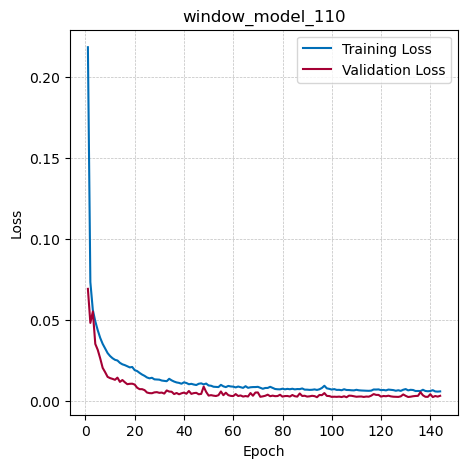

[========================================] 814/814 [100%] in 1.1s (780.61/s)                                            
[========================================] 114/114 [100%] in 0.2s (764.68/s)                                            
Epoch 1/500
9/9 [==============================] - 15s 429ms/step - loss: 0.2667 - mean_absolute_error: 0.4489 - val_loss: 0.1054 - val_mean_absolute_error: 0.2911
Epoch 2/500
9/9 [==============================] - 1s 86ms/step - loss: 0.0729 - mean_absolute_error: 0.2189 - val_loss: 0.0587 - val_mean_absolute_error: 0.1801
Epoch 3/500
9/9 [==============================] - 1s 85ms/step - loss: 0.0574 - mean_absolute_error: 0.2024 - val_loss: 0.0551 - val_mean_absolute_error: 0.2201
Epoch 4/500
9/9 [==============================] - 1s 85ms/step - loss: 0.0548 - mean_absolute_error: 0.2152 - val_loss: 0.0414 - val_mean_absolute_error: 0.1891
Epoch 5/500
9/9 [==============================] - 1s 86ms/step - loss: 0.0470 - mean_absolute_error: 0.1848

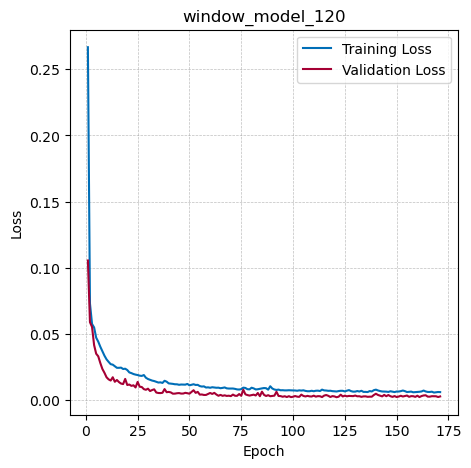

In [74]:
model_layers = np.empty(shape=(7), dtype=dict,)    # create an array to hold the layers of the base model
model_layers[0] = {
    "type": "LSTM",
    "units": 256,
    "activation": "tanh",
}
model_layers[1] = {
    "type": "LSTM",
    "units": 256,
    "activation": "tanh",
}
model_layers[2] = {
    "type": "LSTM",
    "units": 128,
    "activation": "tanh",
}
model_layers[3] = {
    "type": "LSTM",
    "units": 128,
    "activation": "tanh",
}
model_layers[4] = {
    "type": "LSTM",
    "units": 64,
    "activation": "tanh",
}
model_layers[5] = {
    "type": "LSTM",
    "units": 32,
    "activation": "tanh",
}
model_layers[6] = {
    "type": "LSTM",
    "units": 16,
    "activation": "tanh",
}

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=50,
    restore_best_weights=True,
    min_delta=1e-4
)   # early stopping callback

window_sizes = [2, 5, 10, 15, 20, 25, 30, 40, 50, 60, 70, 80, 90, 94, 95, 96, 97, 100, 110, 120]


window_models = []
for window_size in window_sizes:
    train_window_df, train_x, train_y = window_data_base_illumination(train_norm_df, window_size)
    test_window_df, test_x, test_y = window_data_base_illumination(test_norm_df, window_size)
    window_model = Model(train_x, train_y, test_x, test_y, name=f"window_model_{window_size}")
    window_model.create_model(
        model_layers,
        tf.keras.optimizers.Adam(learning_rate=1e-4),
        tf.keras.losses.MeanSquaredError(),
        tf.keras.metrics.MeanAbsoluteError(),
        input_shape=(None, 1),
        output_shape=1,
    )

    window_model.train_model(epochs=500, callbacks=early_stopping)
    window_models.append(window_model.model)

[========================================] 232/232 [100%] in 0.4s (547.84/s)                                            


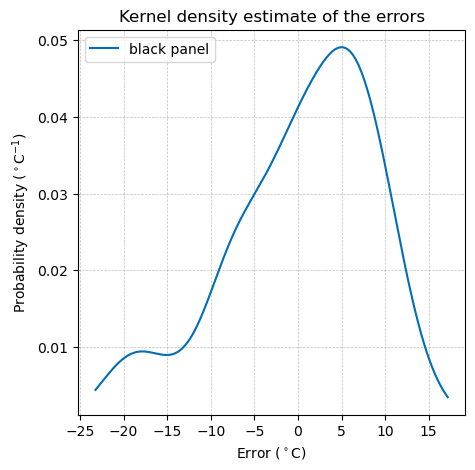

[========================================] 229/229 [100%] in 0.4s (551.15/s)                                            


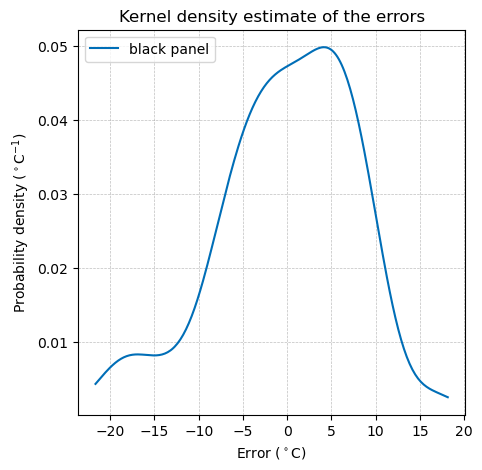

[========================================] 224/224 [100%] in 0.4s (660.58/s)                                            


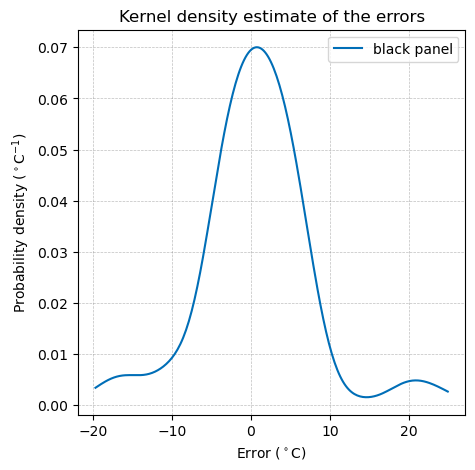

[========================================] 219/219 [100%] in 0.4s (564.38/s)                                            


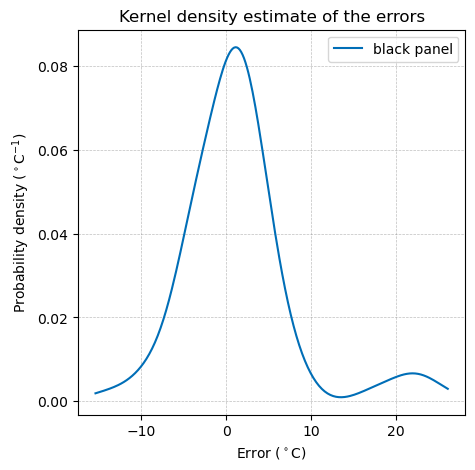

[========================================] 214/214 [100%] in 0.4s (588.01/s)                                            


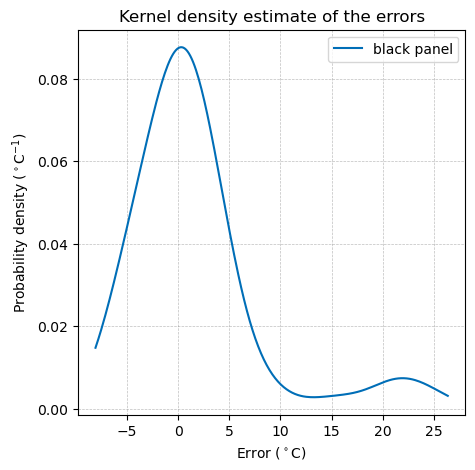

[========================================] 209/209 [100%] in 0.4s (600.36/s)                                            


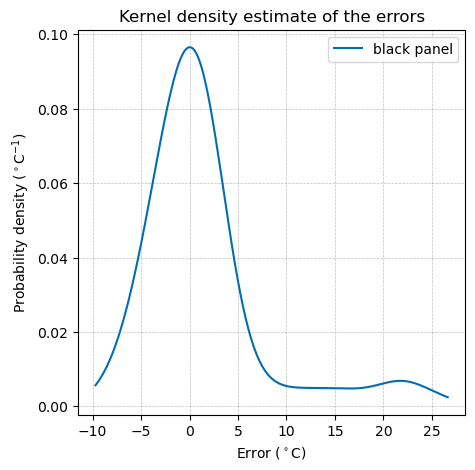

[========================================] 204/204 [100%] in 0.3s (700.71/s)                                            


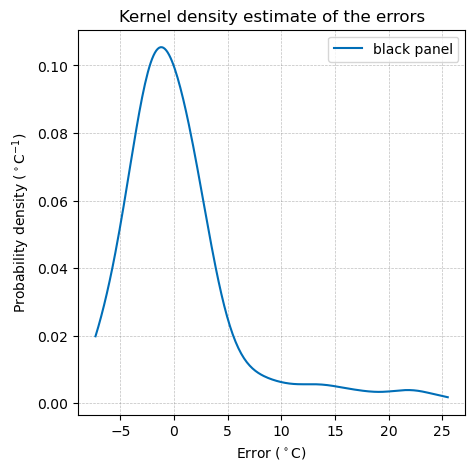

[========================================] 194/194 [100%] in 0.3s (678.05/s)                                            


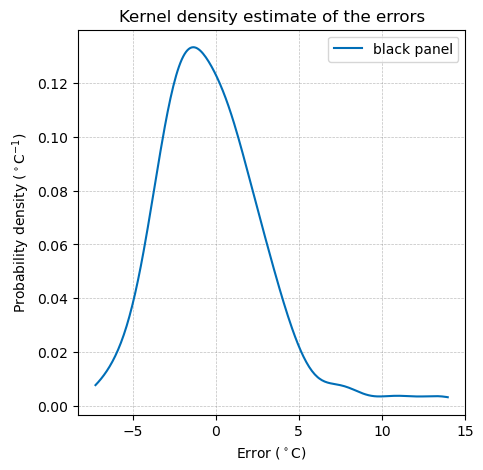

[========================================] 184/184 [100%] in 0.3s (624.27/s)                                            


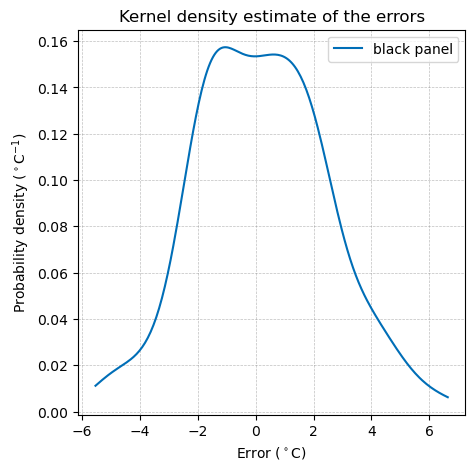

[========================================] 174/174 [100%] in 0.3s (619.41/s)                                            


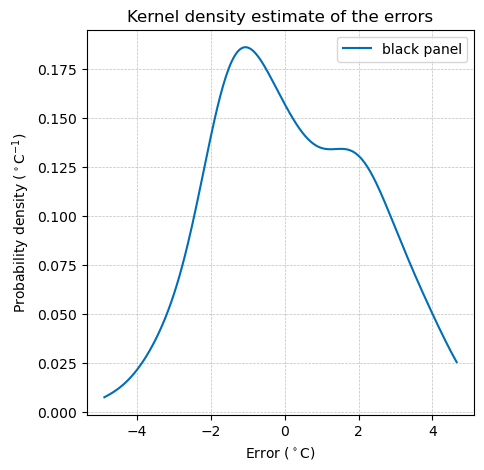

[========================================] 164/164 [100%] in 0.2s (633.66/s)                                            


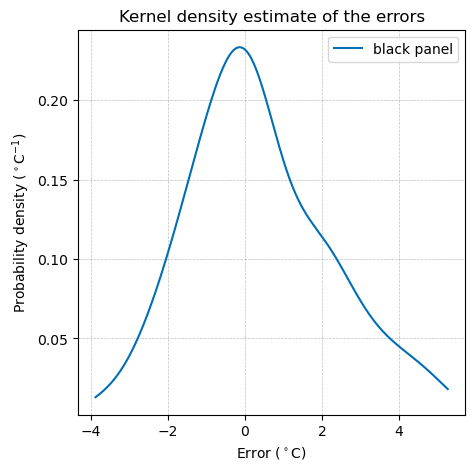

[========================================] 154/154 [100%] in 0.2s (795.71/s)                                            


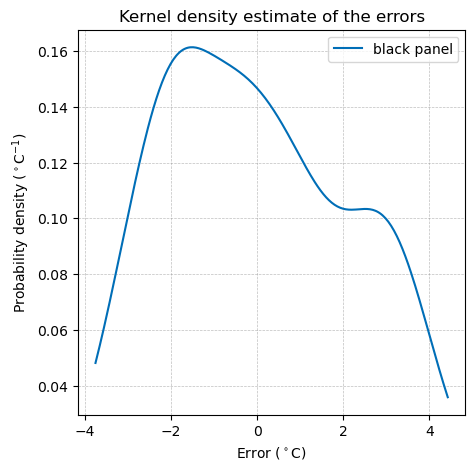

[========================================] 144/144 [100%] in 0.2s (788.25/s)                                            


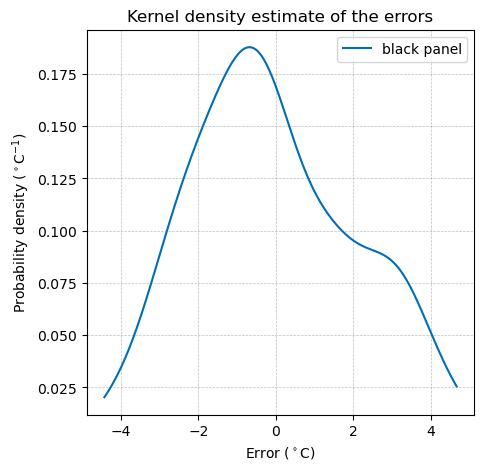

[========================================] 140/140 [100%] in 0.2s (642.11/s)                                            


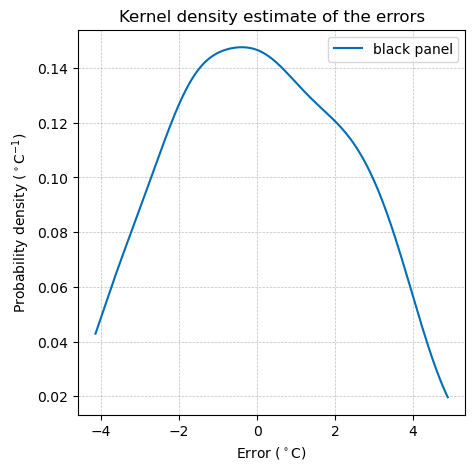

[========================================] 139/139 [100%] in 0.3s (661.00/s)                                            


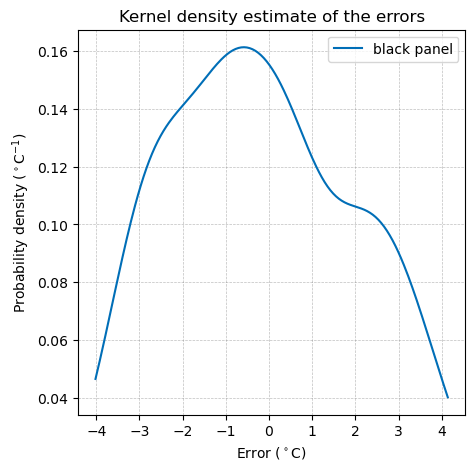

[========================================] 138/138 [100%] in 0.2s (768.31/s)                                            


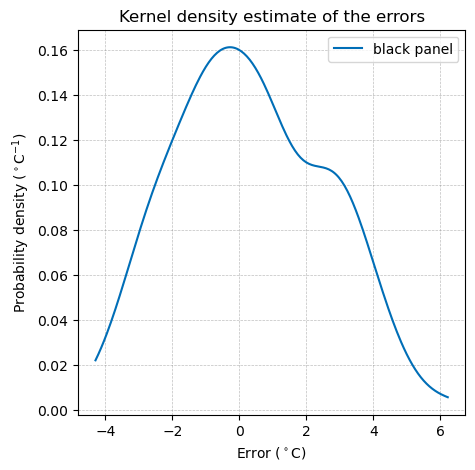

[========================================] 137/137 [100%] in 0.2s (634.57/s)                                            


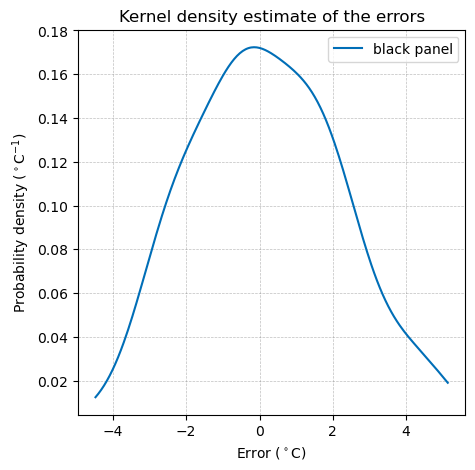

[========================================] 134/134 [100%] in 0.3s (589.95/s)                                            


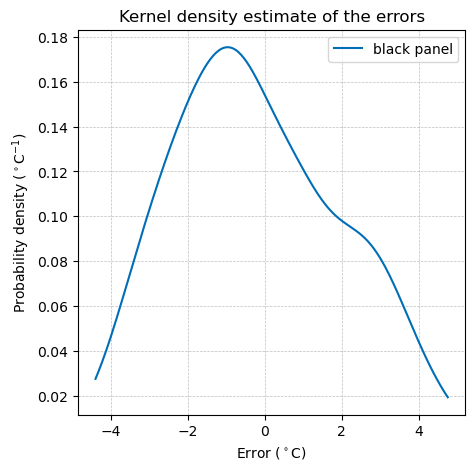

[========================================] 124/124 [100%] in 0.2s (754.88/s)                                            


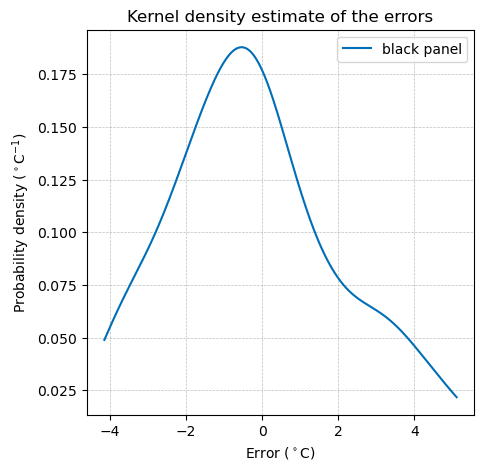

[========================================] 114/114 [100%] in 0.2s (727.76/s)                                            


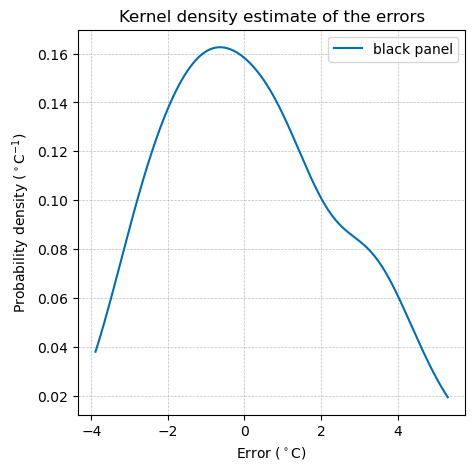

In [160]:
mu = np.zeros((len(window_models),), dtype=np.float64)
sigma = np.zeros((len(window_models),), dtype=np.float64)

for i, model in enumerate(window_models):
    _, test_x, test_y = window_data_base_illumination(test_norm_df, window_sizes[i])
    errors = test_y - model.predict(test_x, verbose=0).flatten()
    errors = errors.reshape((errors.shape[0], 1))
    errors = errors * (norm_limits[1] - norm_limits[0])
    mu[i] = np.mean(errors)
    sigma[i] = np.std(errors)
    _ = kde(errors, labels=["black panel"], plot_kde=True)

In [79]:
import seaborn as sns

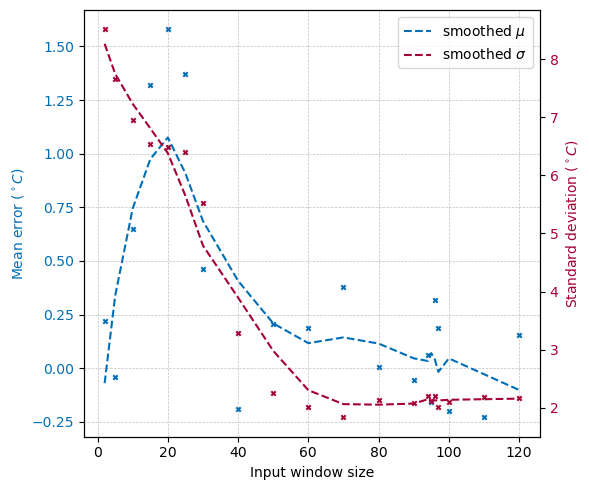

In [110]:
from scipy.signal import savgol_filter
fig, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
ax.scatter(window_sizes, mu, s=10, color=plt_colors[0], marker="x")
# smoothed line
ax.plot(window_sizes, savgol_filter(mu, 5, 1), color=plt_colors[0], linestyle="--", label="smoothed $\mu$")
twin_ax = ax.twinx()
twin_ax.scatter(window_sizes, sigma, s=10, color=plt_colors[1], marker="x")
# smoothed line
twin_ax.plot(window_sizes, savgol_filter(sigma, 5, 1), color=plt_colors[1], linestyle="--", label="smoothed $\sigma$")

# combine legends
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = twin_ax.get_legend_handles_labels()
ax.legend(lines + lines2, labels + labels2, loc=0)
ax.set_ylabel(r"Mean error ($^\circ C$)", color=plt_colors[0])
twin_ax.set_ylabel(r"Standard deviation ($^\circ C$)", color=plt_colors[1])
ax.tick_params(axis="y", labelcolor=plt_colors[0])
twin_ax.tick_params(axis="y", labelcolor=plt_colors[1])
ax.set_xlabel("Input window size")
ax.grid()

plt.show()

In [111]:
fig.savefig(r"../report/images/chapter-4/funcube-black-panel-illumination-lstm.pdf")

In [115]:
print([[i, window_size] for i, window_size in enumerate(window_sizes)])

[[0, 2], [1, 5], [2, 10], [3, 15], [4, 20], [5, 25], [6, 30], [7, 40], [8, 50], [9, 60], [10, 70], [11, 80], [12, 90], [13, 94], [14, 95], [15, 96], [16, 97], [17, 100], [18, 110], [19, 120]]


[========================================] 214/214 [100%] in 0.4s (560.72/s)                                            
Window size: 20
[========================================] 184/184 [100%] in 0.3s (584.42/s)                                            
Window size: 50
[========================================] 174/174 [100%] in 0.2s (607.71/s)                                            
Window size: 60
[========================================] 164/164 [100%] in 0.3s (669.19/s)                                            
Window size: 70
[========================================] 144/144 [100%] in 0.2s (744.17/s)                                            
Window size: 90
[========================================] 138/138 [100%] in 0.3s (605.61/s)                                            
Window size: 96
[========================================] 134/134 [100%] in 0.2s (595.42/s)                                            
Window size: 100


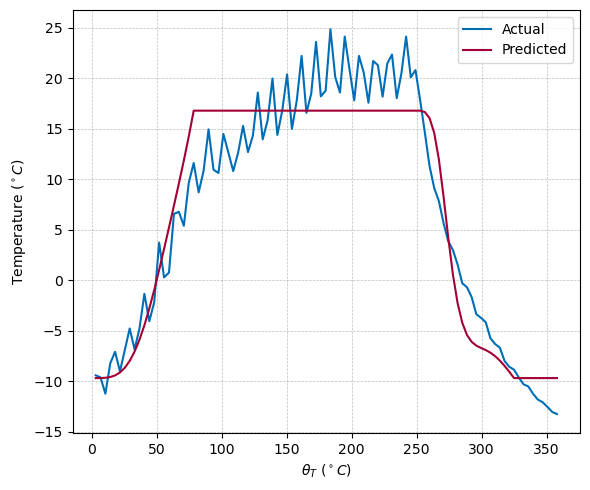

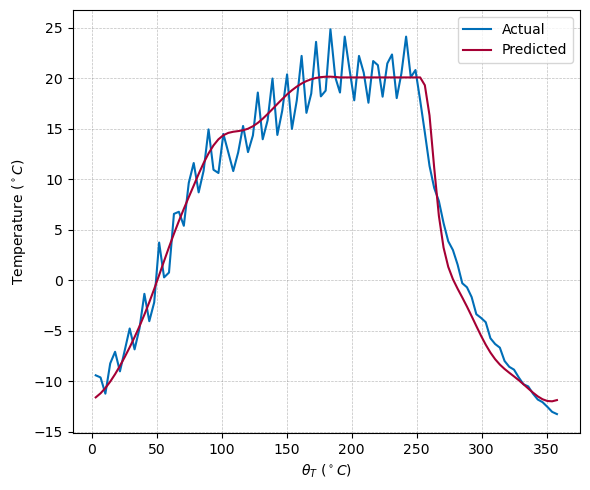

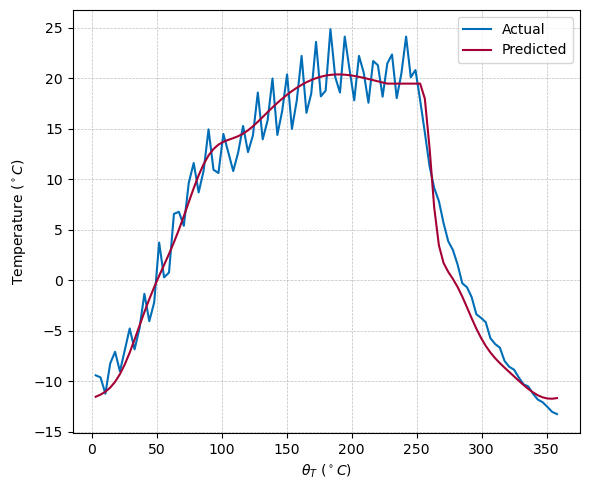

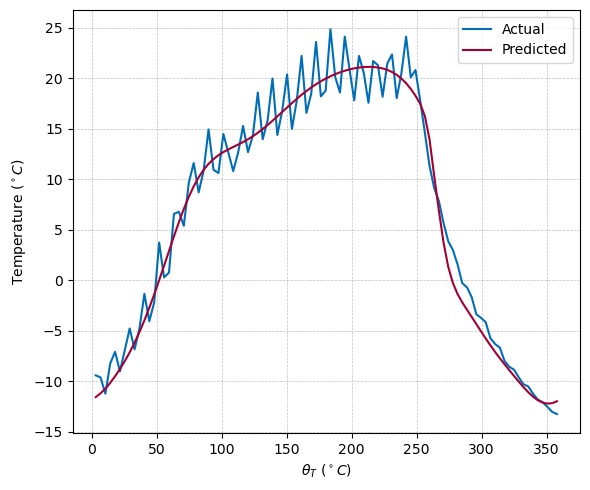

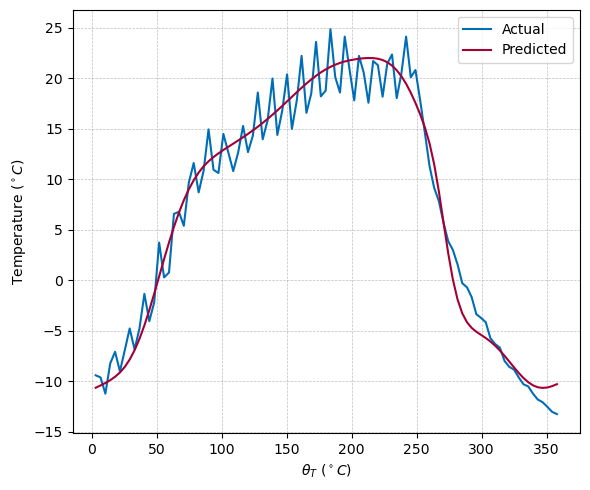

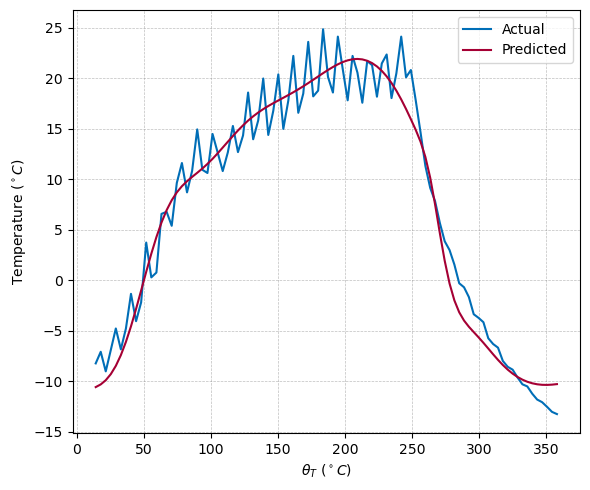

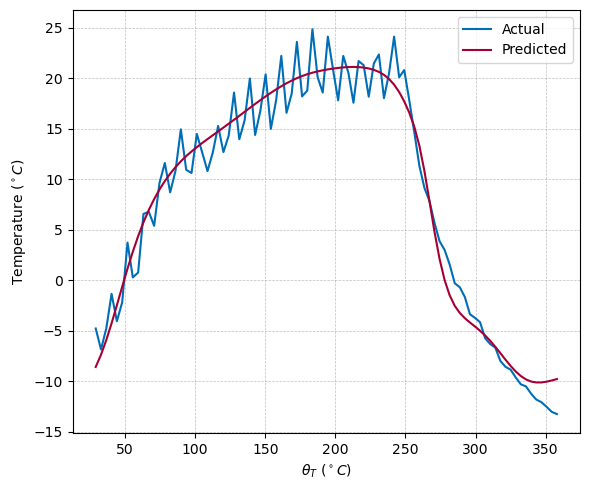

In [117]:
idxs = [4, 8, 9, 10, 12, 15, 17]
for idx in idxs:
    model = window_models[idx]
    test_window_df, test_x, test_y = window_data_base_illumination(test_norm_df, window_sizes[idx])
    test_window_df = test_window_df.reset_index(drop=True)
    theta_T = test_window_df.iloc[:, 0].to_numpy()
    actual = test_y
    preds = model.predict(test_x, verbose=0).flatten()
    actual = denormalize_temperature(actual, norm_limits)
    preds = denormalize_temperature(preds, norm_limits)
    window_size = window_sizes[idx]
    print(f"Window size: {window_size}")

    try:
        start_index = test_window_df[test_window_df["theta_T"] == test_norm_df["theta_T (deg)"][94]].index[0]
    except:
        start_index = 0
        
    end_index = test_window_df[test_window_df["theta_T"] == test_norm_df["theta_T (deg)"][190]].index[0] + 1
    fig, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
    ax.plot(theta_T[start_index:end_index], actual[start_index:end_index], color=plt_colors[0], label="Actual")
    ax.plot(theta_T[start_index:end_index], preds[start_index:end_index], color=plt_colors[1], label="Predicted")
    ax.set_xlabel(r"$\theta_T$ ($^\circ C$)")
    ax.set_ylabel(r"Temperature ($^\circ C$)")
    ax.legend()
    ax.grid()

    fig.savefig(f"../report/images/chapter-4/funcube-black-panel-illumination-lstm-window-{window_size}.pdf")

In [118]:
# Anomaly df
anomaly_df = telem_df.iloc[350:575, :]
anomaly_df = anomaly_df.copy().reset_index(drop=True)
anomaly_norm_df = anomaly_df.copy()
anomaly_norm_df.iloc[:, 6:-1] = normalize_temperature(anomaly_df.iloc[:, 6:], norm_limits)


In [34]:
print(anomaly_df["time (utc)"][127])
print(anomaly_df["time (utc)"][221])

2016-02-04 07:56:00.000
2016-02-04 09:30:00.000


In [119]:
print([[i, window_size] for i, window_size in enumerate(window_sizes)])

[[0, 2], [1, 5], [2, 10], [3, 15], [4, 20], [5, 25], [6, 30], [7, 40], [8, 50], [9, 60], [10, 70], [11, 80], [12, 90], [13, 94], [14, 95], [15, 96], [16, 97], [17, 100], [18, 110], [19, 120]]


[========================================] 205/205 [100%] in 0.3s (684.69/s)                                            
[========================================] 175/175 [100%] in 0.3s (559.34/s)                                            
[========================================] 165/165 [100%] in 0.3s (706.62/s)                                            
[========================================] 155/155 [100%] in 0.2s (747.42/s)                                            
[========================================] 135/135 [100%] in 0.2s (689.00/s)                                            
[========================================] 129/129 [100%] in 0.2s (687.06/s)                                            
[========================================] 125/125 [100%] in 0.2s (688.61/s)                                            


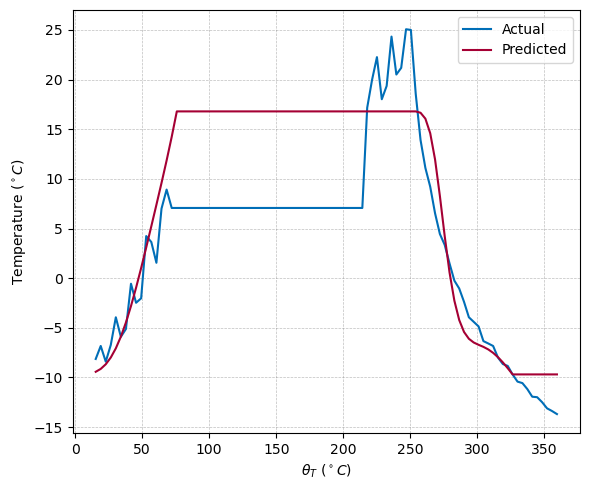

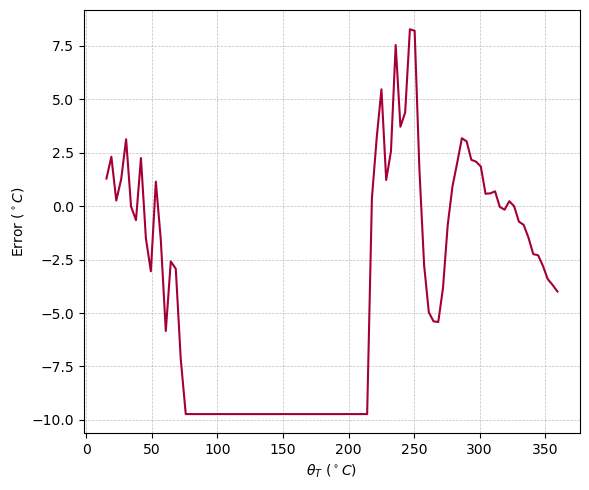

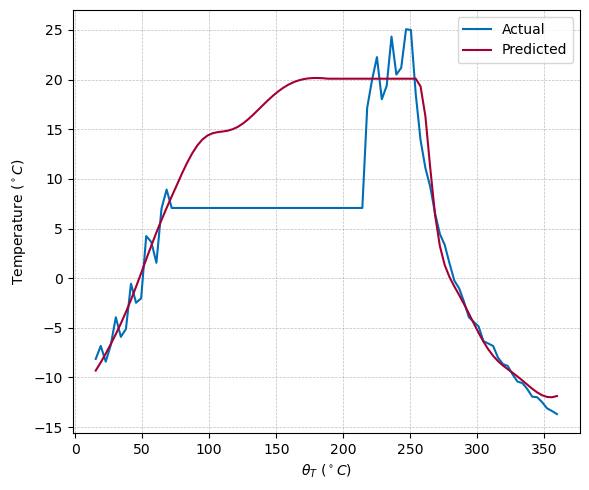

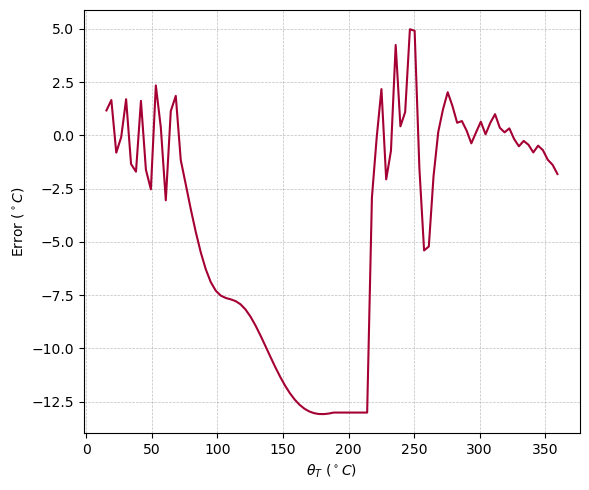

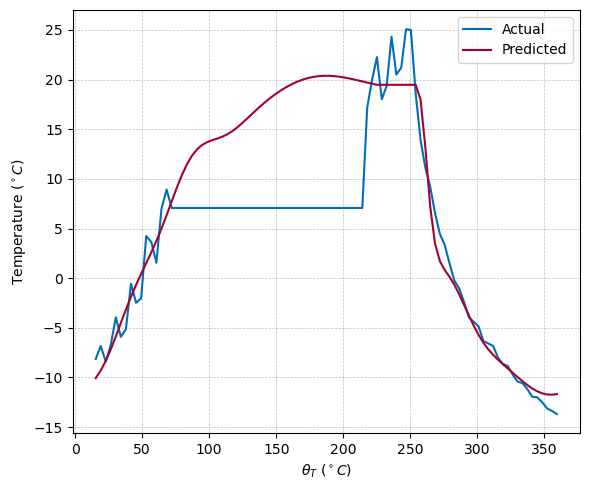

...

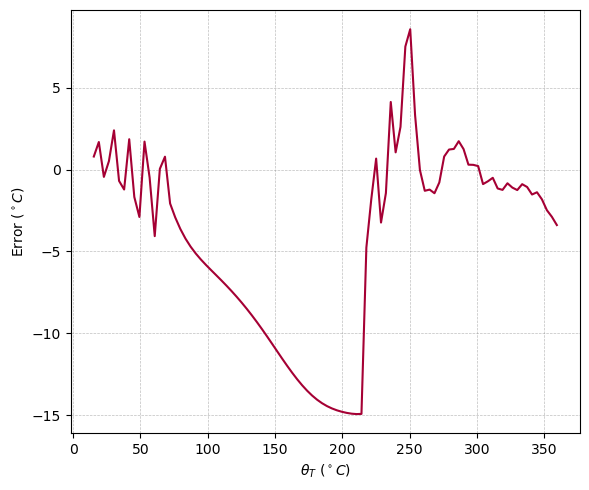

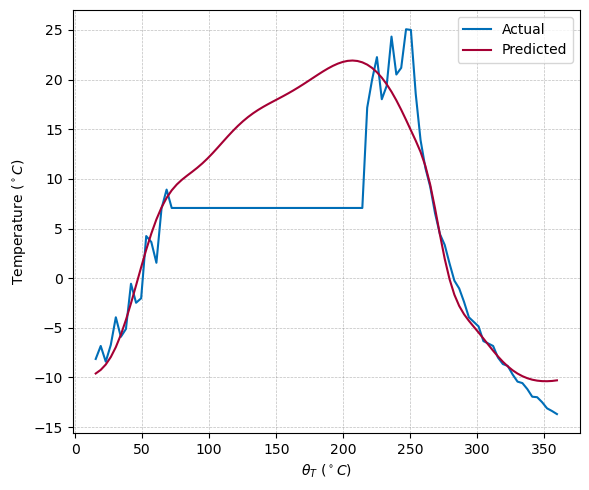

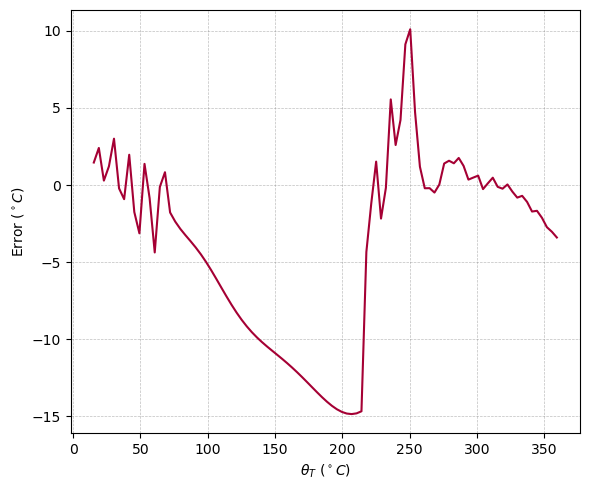

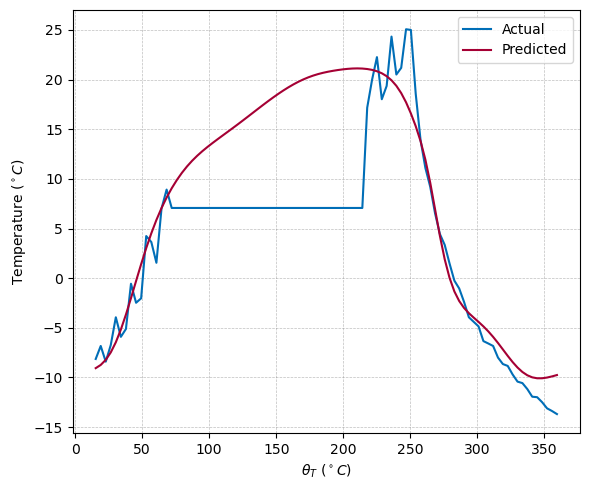

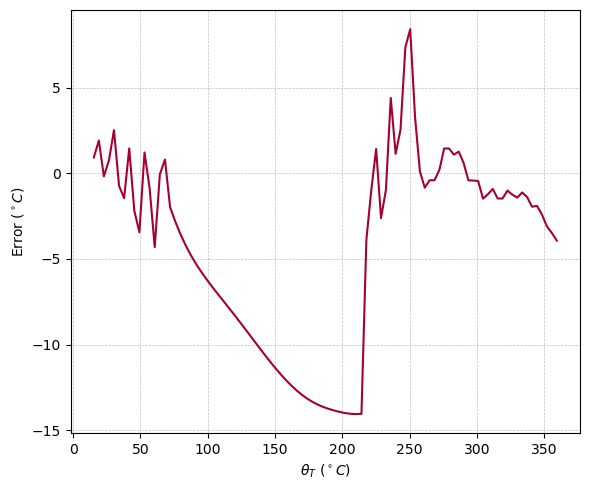

In [122]:
idxs = [4, 8, 9, 10, 12, 15, 17]
for idx in idxs:
    window_size = window_sizes[idx]
    anomaly_windowed_df, anomaly_x, anomaly_y = window_data_base_illumination(anomaly_norm_df, window_sizes[idx])
    theta_T = anomaly_windowed_df.iloc[:, 0].to_numpy()
    actual = anomaly_y
    preds = window_models[idx].predict(anomaly_x, verbose=0).flatten()
    actual = denormalize_temperature(actual, norm_limits)
    preds = denormalize_temperature(preds, norm_limits)
    try:
        start_index = anomaly_windowed_df[anomaly_windowed_df["theta_T"] == anomaly_df["theta_T (deg)"][127]].index[0]
    except:
        start_index = 0
    end_index = anomaly_windowed_df[anomaly_windowed_df["theta_T"] == anomaly_df["theta_T (deg)"][221]].index[0]
    fig, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
    ax.plot(theta_T[start_index:end_index], actual[start_index:end_index], color=plt_colors[0], label="Actual")
    ax.plot(theta_T[start_index:end_index], preds[start_index:end_index], color=plt_colors[1], label="Predicted")
    ax.set_xlabel(r"$\theta_T$ ($^\circ C$)")
    ax.set_ylabel(r"Temperature ($^\circ C$)")
    ax.legend()
    ax.grid()
    
    fig.savefig(f"../report/images/chapter-4/funcube-black-panel-illumination-anomaly-window-{window_size}.pdf")
    
    fig, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
    ax.plot(theta_T[start_index:end_index], actual[start_index:end_index] - preds[start_index:end_index], color=plt_colors[1])
    ax.set_xlabel(r"$\theta_T$ ($^\circ C$)")
    ax.set_ylabel(r"Error ($^\circ C$)")
    ax.grid()
    
    fig.savefig(f"../report/images/chapter-4/funcube-black-panel-illumination-anomaly-window-{window_size}-error.pdf")

### Residual model

In [12]:
def window_data_res_illumination(df, base_window_size, base_model, res_window_size, check_continuous=True):
    df = df.copy()
    columns = np.concatenate(
        (
            ["theta_T"],
            ["black panel in " + str(i) for i in range(res_window_size)],
            ["black panel pred"],
            ["black panel out"],
        )
    )

    window_df = pd.DataFrame(columns=columns, dtype=np.float64)
    illum_list = []

    with alive_bar(df.shape[0] - base_window_size, theme="classic", force_tty=True) as bar:
        for i in range(df.shape[0] - base_window_size):
            if check_continuous and (
                df.loc[i + base_window_size, "time (jd)"] - df.loc[i, "time (jd)"] > 1.25 * (i * 24 * 60)
            ):
                bar()
                continue

            window_df.loc[i, "theta_T"] = df.loc[i + base_window_size, "theta_T (deg)"]
            illumination = df.loc[i : i + base_window_size - 1, "illumination"].to_numpy()
            illum_list.append(illumination)
            # pred = base_model.predict(illumination.reshape(1, base_window_size, 1), verbose=0).flatten()[0]
            window_df.loc[i, "black panel in 0":f"black panel in {res_window_size-1}"] = df.loc[
                i + base_window_size - res_window_size : i + base_window_size - 1, "black panel temperature (deg C)"
            ].to_numpy()
            
            # window_df.loc[i, "black panel pred"] = pred
            # window_df.loc[i, "black panel out"] = df.loc[i + base_window_size, "black panel temperature (deg C)"] - pred
            bar()
            
    preds = base_model.predict(np.array(illum_list).reshape(-1, base_window_size, 1), verbose=0).flatten()
    window_df["black panel pred"] = preds
    
    for i, row in window_df.iterrows():
        window_df.loc[i, "black panel out"] = df.loc[i + base_window_size, "black panel temperature (deg C)"] - row["black panel pred"]

    x = np.zeros((window_df.shape[0], res_window_size+1), dtype=np.float64)
    y = np.zeros((window_df.shape[0], 1), dtype=np.float64)

    x = window_df.iloc[:, -res_window_size-2:-1]
    y = window_df.iloc[:, -1].to_numpy()

    return window_df, x, y

In [13]:
base_model_window_size = 96
train_window_df, train_x, train_y = window_data_base_illumination(train_norm_df, base_model_window_size)
test_window_df, test_x, test_y = window_data_base_illumination(test_norm_df, base_model_window_size)


[========================================] 838/838 [100%] in 1.2s (694.87/s)                                            
[========================================] 138/138 [100%] in 0.2s (719.68/s)                                            


2023-06-01 19:24:09.807270: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-01 19:24:09.808597: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-01 19:24:09.809239: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-06-01 19:24:09.809652: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least on

Epoch 1/500


2023-06-01 19:24:27.974165: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8700
2023-06-01 19:24:28.441415: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7fe1d8016830 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-06-01 19:24:28.441452: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce GTX 1060, Compute Capability 6.1
2023-06-01 19:24:28.449287: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-06-01 19:24:28.568318: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-06-01 19:24:28.628580: I tensorflow/compiler/jit/xla_compilation_cache.cc:477] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


9/9 [==============================] - 19s 453ms/step - loss: 0.2700 - mean_absolute_error: 0.4559 - val_loss: 0.1300 - val_mean_absolute_error: 0.3176
Epoch 2/500
9/9 [==============================] - 1s 76ms/step - loss: 0.0743 - mean_absolute_error: 0.2308 - val_loss: 0.0556 - val_mean_absolute_error: 0.1663
Epoch 3/500
9/9 [==============================] - 1s 72ms/step - loss: 0.0636 - mean_absolute_error: 0.1961 - val_loss: 0.0405 - val_mean_absolute_error: 0.1832
Epoch 4/500
9/9 [==============================] - 1s 71ms/step - loss: 0.0515 - mean_absolute_error: 0.2080 - val_loss: 0.0404 - val_mean_absolute_error: 0.1846
Epoch 5/500
9/9 [==============================] - 1s 72ms/step - loss: 0.0453 - mean_absolute_error: 0.1902 - val_loss: 0.0298 - val_mean_absolute_error: 0.1467
Epoch 6/500
9/9 [==============================] - 1s 72ms/step - loss: 0.0416 - mean_absolute_error: 0.1735 - val_loss: 0.0263 - val_mean_absolute_error: 0.1419
Epoch 7/500
9/9 [=====================

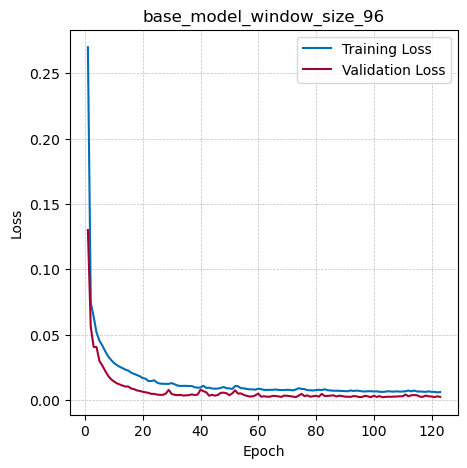

In [15]:
model_layers = np.empty(shape=(7), dtype=dict,)    # create an array to hold the layers of the base model
model_layers[0] = {
    "type": "LSTM",
    "units": 256,
    "activation": "tanh",
}
model_layers[1] = {
    "type": "LSTM",
    "units": 256,
    "activation": "tanh",
}
model_layers[2] = {
    "type": "LSTM",
    "units": 128,
    "activation": "tanh",
}
model_layers[3] = {
    "type": "LSTM",
    "units": 128,
    "activation": "tanh",
}
model_layers[4] = {
    "type": "LSTM",
    "units": 64,
    "activation": "tanh",
}
model_layers[5] = {
    "type": "LSTM",
    "units": 32,
    "activation": "tanh",
}
model_layers[6] = {
    "type": "LSTM",
    "units": 16,
    "activation": "tanh",
}

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=50,
    restore_best_weights=True,
    min_delta=1e-4
)   # early stopping callback


base_model = Model(train_x, train_y, test_x, test_y, name=f"base_model_window_size_{base_model_window_size}")
base_model.create_model(
    model_layers,
    tf.keras.optimizers.Adam(learning_rate=1e-4),
    tf.keras.losses.MeanSquaredError(),
    tf.keras.metrics.MeanAbsoluteError(),
    input_shape=(None, 1),
    output_shape=1,
)

base_model.train_model(epochs=500, callbacks=early_stopping)

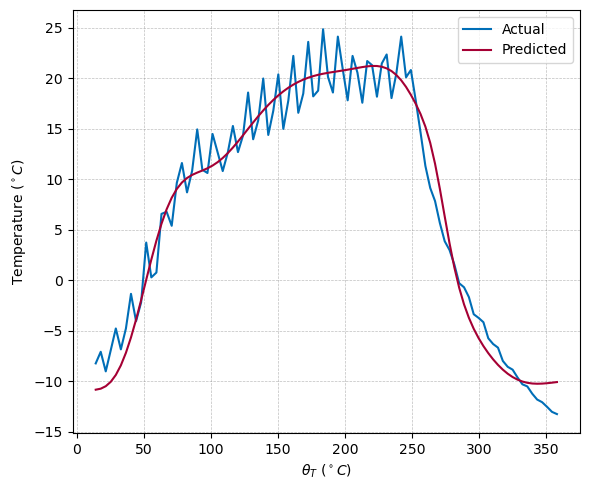

In [16]:
theta_T = test_window_df.iloc[:, 0].to_numpy()
actual = test_y
preds = base_model.model.predict(test_x, verbose=0).flatten()
actual = denormalize_temperature(actual, norm_limits)
preds = denormalize_temperature(preds, norm_limits)
try:
    start_index = test_window_df[test_window_df["theta_T"] == test_norm_df["theta_T (deg)"][94]].index[0]
except:
    start_index = 0
        
end_index = test_window_df[test_window_df["theta_T"] == test_norm_df["theta_T (deg)"][190]].index[0]
fig, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
ax.plot(theta_T[start_index:end_index], actual[start_index:end_index], color=plt_colors[0], label="Actual")
ax.plot(theta_T[start_index:end_index], preds[start_index:end_index], color=plt_colors[1], label="Predicted")
ax.set_xlabel(r"$\theta_T$ ($^\circ C$)")
ax.set_ylabel(r"Temperature ($^\circ C$)")
ax.legend()
ax.grid()

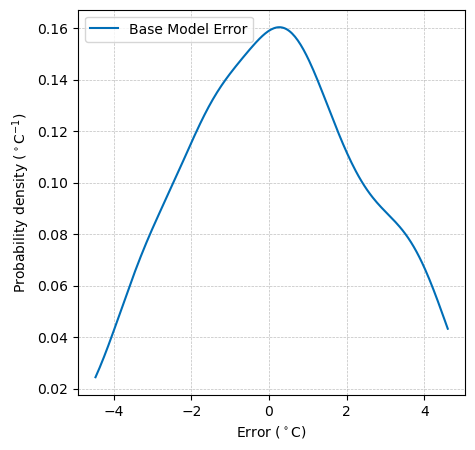

In [17]:
base_errors = (actual - preds).reshape(-1, 1)

# errors.reshape((errors.shape[0], 1))
_ = kde(base_errors, labels=["Base Model Error"], plt_title="")

In [18]:
res_model_layers = np.empty(shape=(7), dtype=dict,)    # create an array to hold the layers of the base model
res_model_layers[0] = {
    "type": "Dense",
    "units": 256,
    "activation": "relu",
}
res_model_layers[1] = {
    "type": "Dense",
    "units": 256,
    "activation": "relu",
}
res_model_layers[2] = {
    "type": "Dense",
    "units": 128,
    "activation": "relu",
}
res_model_layers[3] = {
    "type": "Dense",
    "units": 128,
    "activation": "relu",
}
res_model_layers[4] = {
    "type": "Dense",
    "units": 64,
    "activation": "relu",
}
res_model_layers[5] = {
    "type": "Dense",
    "units": 32,
    "activation": "relu",
}
res_model_layers[6] = {
    "type": "Dense",
    "units": 16,
    "activation": "relu",
}

In [19]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=100,
    restore_best_weights=True,
    min_delta=1e-6,
)   # early stopping callback

[========================================] 838/838 [100%] in 1.1s (762.58/s)                                            
[========================================] 138/138 [100%] in 0.2s (834.92/s)                                            
Epoch 1/5000
9/9 [==============================] - 3s 36ms/step - loss: 0.0085 - mean_absolute_error: 0.0620 - val_loss: 0.0024 - val_mean_absolute_error: 0.0406
Epoch 2/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0083 - mean_absolute_error: 0.0607 - val_loss: 0.0023 - val_mean_absolute_error: 0.0398
Epoch 3/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0081 - mean_absolute_error: 0.0598 - val_loss: 0.0022 - val_mean_absolute_error: 0.0392
Epoch 4/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0079 - mean_absolute_error: 0.0591 - val_loss: 0.0022 - val_mean_absolute_error: 0.0387
Epoch 5/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0078 - mean_absolute_error: 0.0

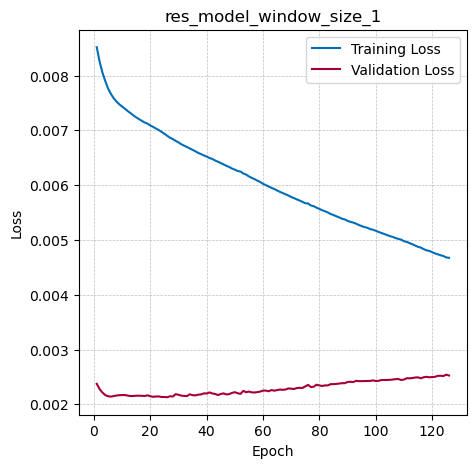

[========================================] 838/838 [100%] in 0.9s (942.70/s)                                            
[========================================] 138/138 [100%] in 0.2s (1006.13/s)                                           
Epoch 1/5000
9/9 [==============================] - 3s 36ms/step - loss: 0.0075 - mean_absolute_error: 0.0578 - val_loss: 0.0023 - val_mean_absolute_error: 0.0390
Epoch 2/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0074 - mean_absolute_error: 0.0576 - val_loss: 0.0023 - val_mean_absolute_error: 0.0392
Epoch 3/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0073 - mean_absolute_error: 0.0574 - val_loss: 0.0023 - val_mean_absolute_error: 0.0389
Epoch 4/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0073 - mean_absolute_error: 0.0571 - val_loss: 0.0023 - val_mean_absolute_error: 0.0390
Epoch 5/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0072 - mean_absolute_error: 0.0

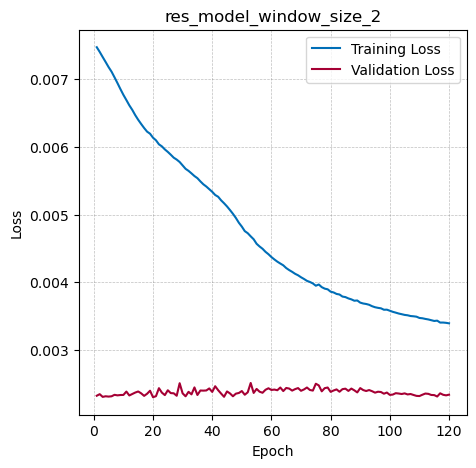

[========================================] 838/838 [100%] in 1.0s (855.67/s)                                            
[========================================] 138/138 [100%] in 0.2s (952.18/s)                                            
Epoch 1/5000
9/9 [==============================] - 3s 37ms/step - loss: 0.0076 - mean_absolute_error: 0.0587 - val_loss: 0.0023 - val_mean_absolute_error: 0.0392
Epoch 2/5000
9/9 [==============================] - 0s 13ms/step - loss: 0.0075 - mean_absolute_error: 0.0578 - val_loss: 0.0023 - val_mean_absolute_error: 0.0388
Epoch 3/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0074 - mean_absolute_error: 0.0573 - val_loss: 0.0022 - val_mean_absolute_error: 0.0384
Epoch 4/5000
9/9 [==============================] - 0s 12ms/step - loss: 0.0073 - mean_absolute_error: 0.0570 - val_loss: 0.0022 - val_mean_absolute_error: 0.0383
Epoch 5/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0072 - mean_absolute_error: 0.0

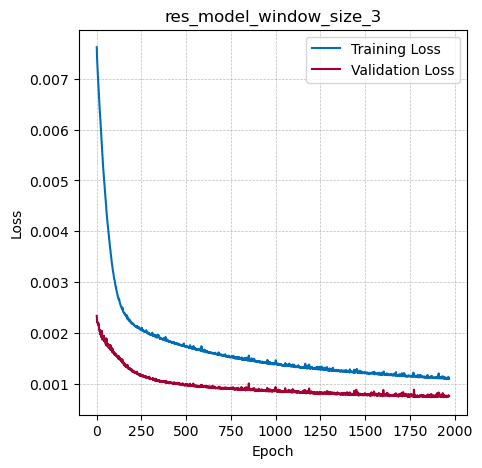

[========================================] 838/838 [100%] in 0.9s (915.32/s)                                            
[========================================] 138/138 [100%] in 0.2s (923.27/s)                                            
Epoch 1/5000
9/9 [==============================] - 4s 37ms/step - loss: 0.0077 - mean_absolute_error: 0.0581 - val_loss: 0.0021 - val_mean_absolute_error: 0.0380
Epoch 2/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0076 - mean_absolute_error: 0.0578 - val_loss: 0.0022 - val_mean_absolute_error: 0.0381
Epoch 3/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0076 - mean_absolute_error: 0.0576 - val_loss: 0.0022 - val_mean_absolute_error: 0.0382
Epoch 4/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0075 - mean_absolute_error: 0.0574 - val_loss: 0.0022 - val_mean_absolute_error: 0.0383
Epoch 5/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0074 - mean_absolute_error: 0.0

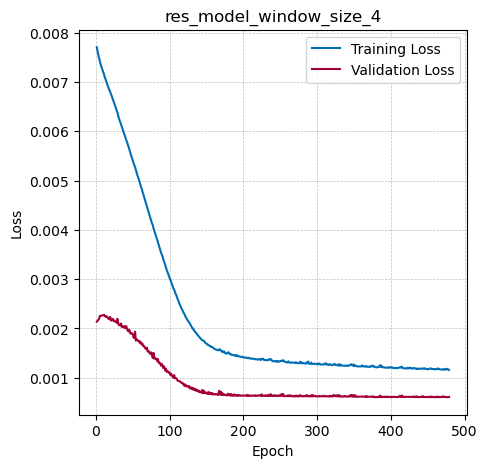

[========================================] 838/838 [100%] in 1.0s (877.54/s)                                            
[========================================] 138/138 [100%] in 0.2s (920.78/s)                                            
Epoch 1/5000
9/9 [==============================] - 4s 40ms/step - loss: 0.0084 - mean_absolute_error: 0.0647 - val_loss: 0.0032 - val_mean_absolute_error: 0.0455
Epoch 2/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0078 - mean_absolute_error: 0.0603 - val_loss: 0.0026 - val_mean_absolute_error: 0.0407
Epoch 3/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0075 - mean_absolute_error: 0.0580 - val_loss: 0.0022 - val_mean_absolute_error: 0.0383
Epoch 4/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0073 - mean_absolute_error: 0.0569 - val_loss: 0.0021 - val_mean_absolute_error: 0.0375
Epoch 5/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0072 - mean_absolute_error: 0.0

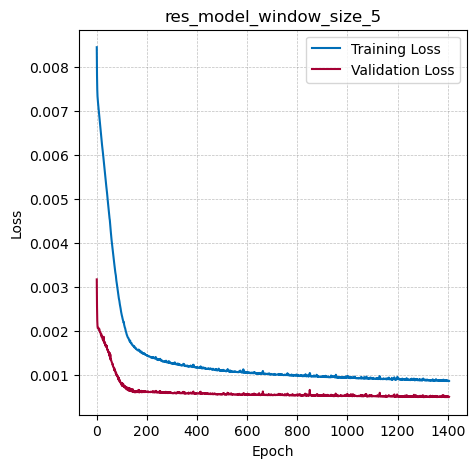

[========================================] 838/838 [100%] in 1.0s (826.77/s)                                            
[========================================] 138/138 [100%] in 0.2s (858.25/s)                                            
Epoch 1/5000
9/9 [==============================] - 3s 35ms/step - loss: 0.0078 - mean_absolute_error: 0.0585 - val_loss: 0.0023 - val_mean_absolute_error: 0.0387
Epoch 2/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0077 - mean_absolute_error: 0.0582 - val_loss: 0.0023 - val_mean_absolute_error: 0.0392
Epoch 3/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0075 - mean_absolute_error: 0.0578 - val_loss: 0.0022 - val_mean_absolute_error: 0.0385
Epoch 4/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0075 - mean_absolute_error: 0.0573 - val_loss: 0.0022 - val_mean_absolute_error: 0.0382
Epoch 5/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0074 - mean_absolute_error: 0.0

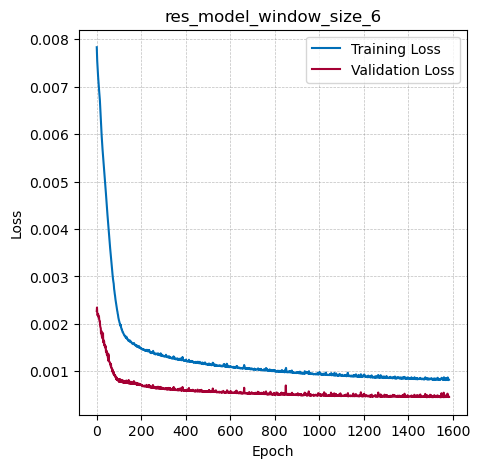

[========================================] 838/838 [100%] in 0.9s (933.56/s)                                            
[========================================] 138/138 [100%] in 0.1s (1028.85/s)                                           
Epoch 1/5000
9/9 [==============================] - 3s 35ms/step - loss: 0.0077 - mean_absolute_error: 0.0577 - val_loss: 0.0022 - val_mean_absolute_error: 0.0379
Epoch 2/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0076 - mean_absolute_error: 0.0576 - val_loss: 0.0022 - val_mean_absolute_error: 0.0382
Epoch 3/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0075 - mean_absolute_error: 0.0575 - val_loss: 0.0022 - val_mean_absolute_error: 0.0382
Epoch 4/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0075 - mean_absolute_error: 0.0574 - val_loss: 0.0022 - val_mean_absolute_error: 0.0383
Epoch 5/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0074 - mean_absolute_error: 0.0

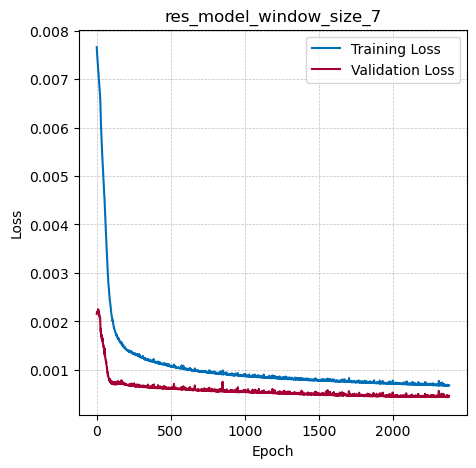

[========================================] 838/838 [100%] in 1.0s (908.02/s)                                            
[========================================] 138/138 [100%] in 0.2s (968.08/s)                                            
Epoch 1/5000
9/9 [==============================] - 4s 34ms/step - loss: 0.0081 - mean_absolute_error: 0.0597 - val_loss: 0.0022 - val_mean_absolute_error: 0.0385
Epoch 2/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0079 - mean_absolute_error: 0.0591 - val_loss: 0.0021 - val_mean_absolute_error: 0.0384
Epoch 3/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0079 - mean_absolute_error: 0.0588 - val_loss: 0.0021 - val_mean_absolute_error: 0.0382
Epoch 4/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0078 - mean_absolute_error: 0.0585 - val_loss: 0.0021 - val_mean_absolute_error: 0.0381
Epoch 5/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0077 - mean_absolute_error: 0.0

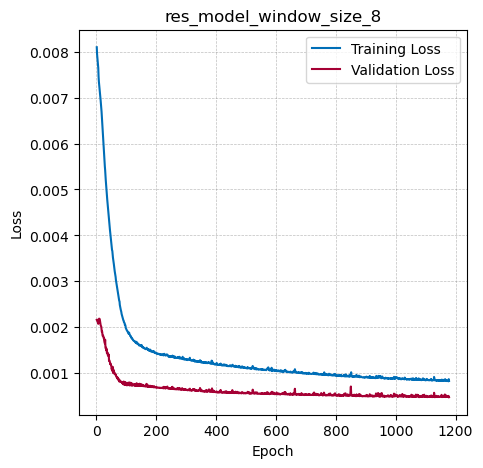

[========================================] 838/838 [100%] in 0.9s (927.91/s)                                            
[========================================] 138/138 [100%] in 0.2s (918.46/s)                                            
Epoch 1/5000
9/9 [==============================] - 4s 37ms/step - loss: 0.0145 - mean_absolute_error: 0.0911 - val_loss: 0.0053 - val_mean_absolute_error: 0.0589
Epoch 2/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0122 - mean_absolute_error: 0.0804 - val_loss: 0.0039 - val_mean_absolute_error: 0.0509
Epoch 3/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0106 - mean_absolute_error: 0.0721 - val_loss: 0.0031 - val_mean_absolute_error: 0.0455
Epoch 4/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0095 - mean_absolute_error: 0.0660 - val_loss: 0.0025 - val_mean_absolute_error: 0.0415
Epoch 5/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0087 - mean_absolute_error: 0.0

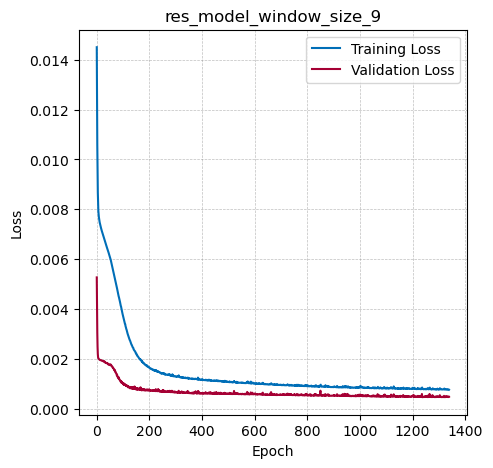

[========================================] 838/838 [100%] in 0.9s (937.39/s)                                            
[========================================] 138/138 [100%] in 0.1s (1004.49/s)                                           
Epoch 1/5000
9/9 [==============================] - 4s 38ms/step - loss: 0.0091 - mean_absolute_error: 0.0644 - val_loss: 0.0025 - val_mean_absolute_error: 0.0414
Epoch 2/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0085 - mean_absolute_error: 0.0617 - val_loss: 0.0023 - val_mean_absolute_error: 0.0396
Epoch 3/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0079 - mean_absolute_error: 0.0593 - val_loss: 0.0021 - val_mean_absolute_error: 0.0386
Epoch 4/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0076 - mean_absolute_error: 0.0578 - val_loss: 0.0021 - val_mean_absolute_error: 0.0381
Epoch 5/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0073 - mean_absolute_error: 0.0

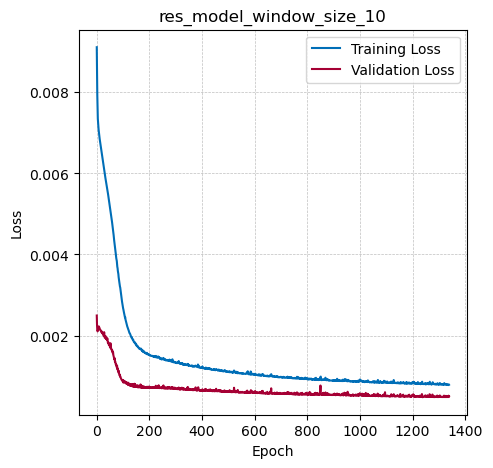

In [28]:
res_window_sizes = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
res_models = []
for res_window_size in res_window_sizes:
    train_window_res_df, train_res_x, train_res_y = window_data_res_illumination(train_norm_df, 96, base_model.model, res_window_size)
    test_window_res_df, test_res_x, test_res_y = window_data_res_illumination(test_norm_df, 96, base_model.model, res_window_size)
    
    res_model = Model(train_res_x, train_res_y, test_res_x, test_res_y, name=f"res_model_window_size_{res_window_size}")
    res_model.create_model(
        res_model_layers,
        tf.keras.optimizers.Adam(learning_rate=1e-5),
        tf.keras.losses.MeanSquaredError(),
        tf.keras.metrics.MeanAbsoluteError(),
        input_shape=(res_window_size+1,),
        output_shape=1,
    )

    res_model.train_model(epochs=5000, callbacks=early_stopping)
    
    res_models.append(res_model.model)


[========================================] 138/138 [100%] in 0.2s (665.40/s)                                            
[========================================] 138/138 [100%] in 0.2s (850.14/s)                                            


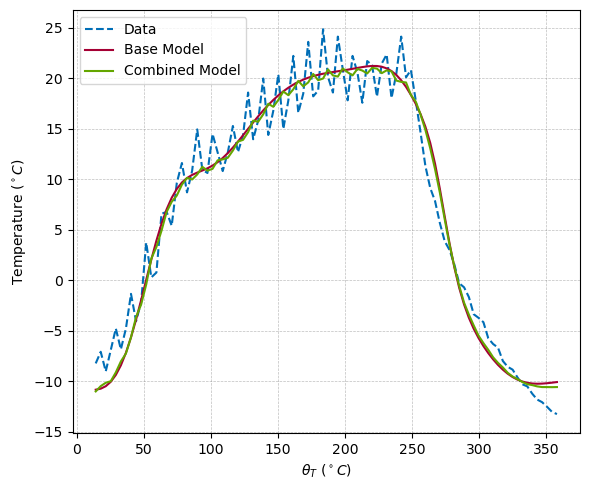

[========================================] 138/138 [100%] in 0.3s (620.39/s)                                            
[========================================] 138/138 [100%] in 0.2s (854.83/s)                                            


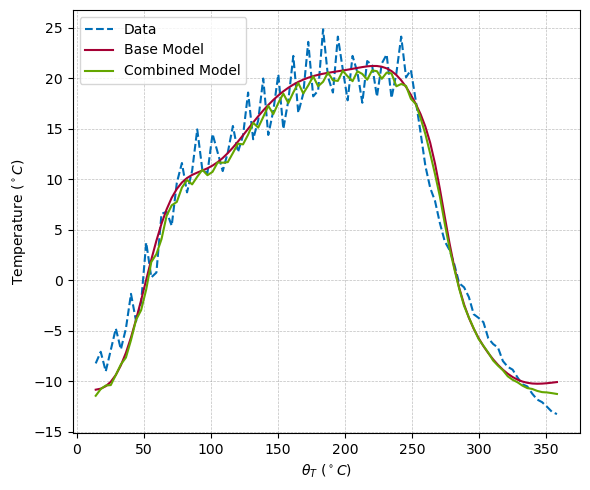

[========================================] 138/138 [100%] in 0.2s (648.00/s)                                            
[========================================] 138/138 [100%] in 0.2s (876.34/s)                                            


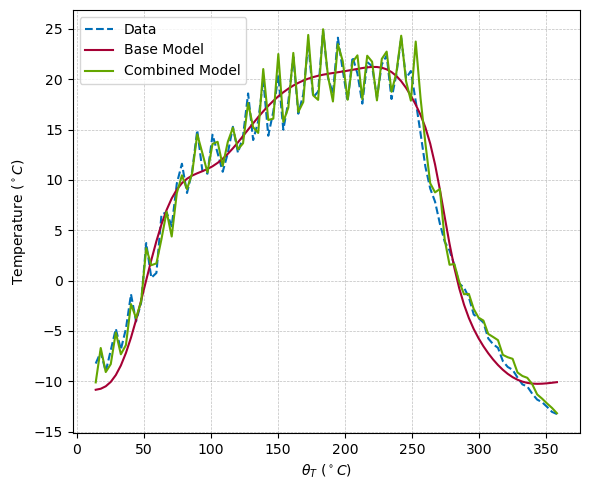

[========================================] 138/138 [100%] in 0.2s (637.62/s)                                            
[========================================] 138/138 [100%] in 0.2s (900.23/s)                                            


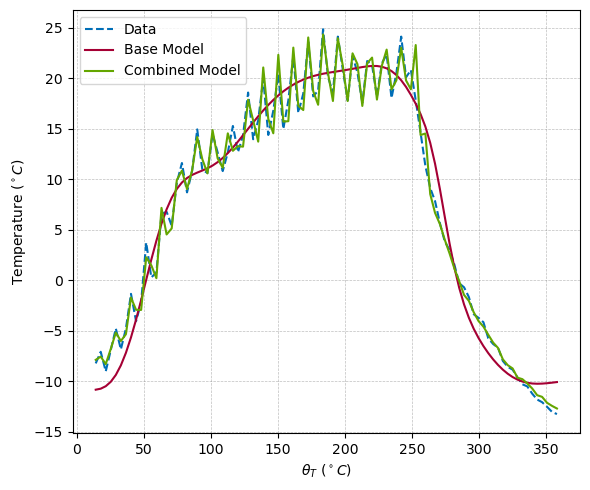

[========================================] 138/138 [100%] in 0.2s (704.84/s)                                            
[========================================] 138/138 [100%] in 0.2s (853.31/s)                                            


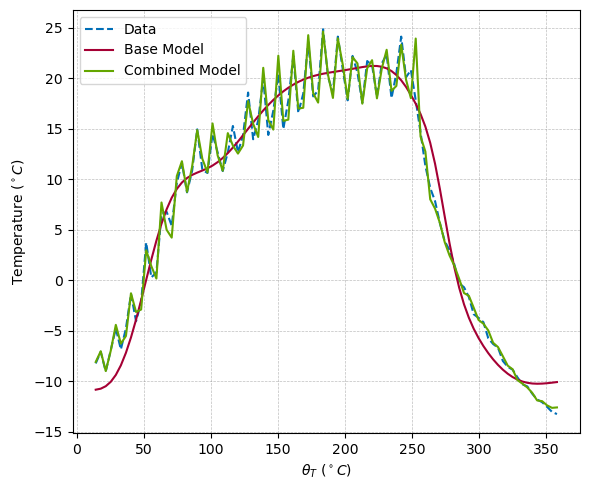

[========================================] 138/138 [100%] in 0.2s (714.30/s)                                            
[========================================] 138/138 [100%] in 0.2s (770.00/s) 


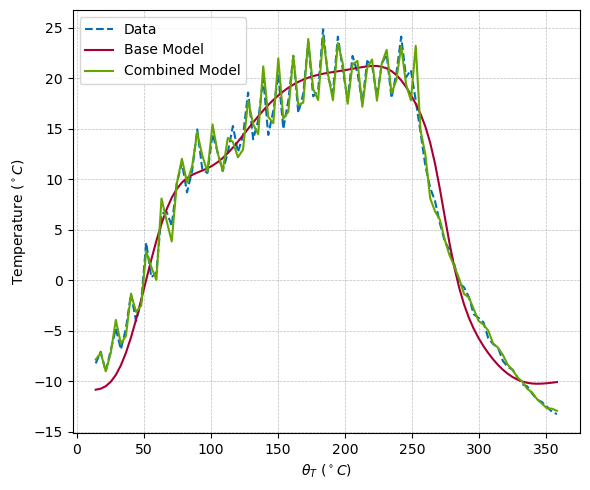

[========================================] 138/138 [100%] in 0.3s (516.26/s)                                            
[========================================] 138/138 [100%] in 0.2s (591.36/s)                                            


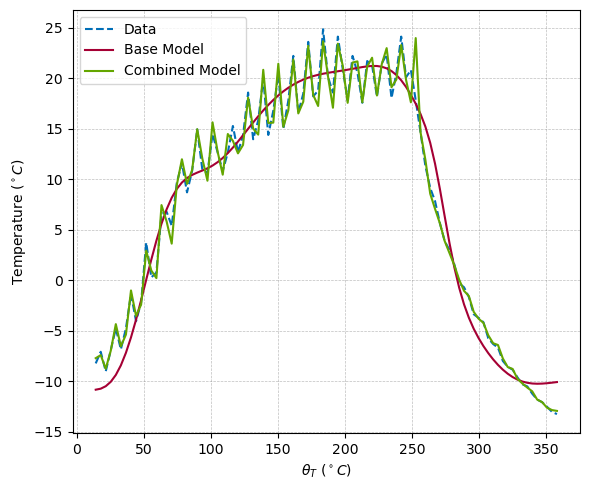

[========================================] 138/138 [100%] in 0.2s (762.77/s)                                            
[========================================] 138/138 [100%] in 0.2s (854.67/s)                                            


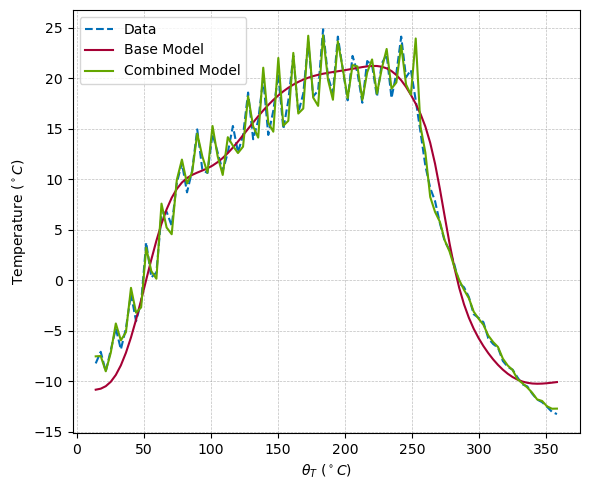

[========================================] 138/138 [100%] in 0.3s (623.14/s)                                            
[========================================] 138/138 [100%] in 0.2s (843.07/s)                                            


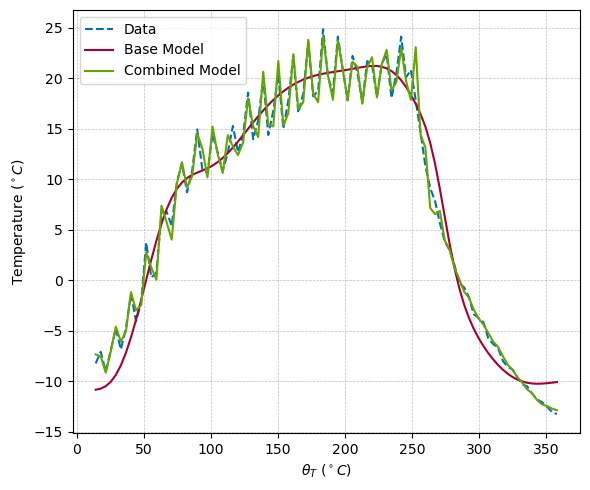

[========================================] 138/138 [100%] in 0.2s (709.64/s)                                            
[========================================] 138/138 [100%] in 0.2s (698.45/s)                                            


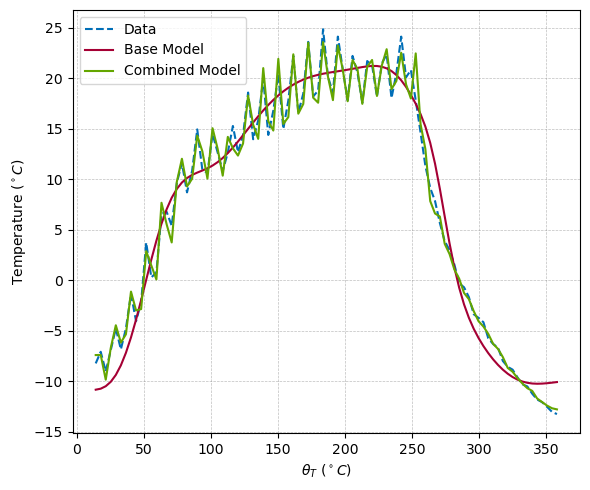

In [62]:
errors = []
for idx, res_window_size in enumerate(res_window_sizes):
    res_model = res_models[idx]

    test_window_df, test_x, test_y = window_data_base_illumination(test_norm_df, 96)
    test_window_res_df, test_res_x, test_res_y = window_data_res_illumination(test_norm_df, 96, base_model.model, res_window_size)

    theta_T = test_window_df.iloc[:, 0].to_numpy()
    actual = denormalize_temperature(test_y, norm_limits)
    base_preds = base_model.model.predict(test_x, verbose=0).flatten()
    res_preds = res_model.predict(test_res_x, verbose=0).flatten()
    combined_preds = denormalize_temperature(base_preds + res_preds, norm_limits)
    base_preds = denormalize_temperature(base_preds, norm_limits)
    
    base_errors = (actual - base_preds)
    res_errors = (actual - combined_preds)

    errors.append(res_errors)
    
    try:
        start_index = test_window_df[test_window_df["theta_T"] == test_norm_df["theta_T (deg)"][94]].index[0]
    except:
        start_index = 0
            
    end_index = test_window_df[test_window_df["theta_T"] == test_norm_df["theta_T (deg)"][190]].index[0]


    fig, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
    ax.plot(theta_T[start_index:end_index], actual[start_index:end_index], color=plt_colors[0], label="Data", linestyle="--")
    ax.plot(theta_T[start_index:end_index], base_preds[start_index:end_index], color=plt_colors[1], label="Base Model")
    ax.plot(theta_T[start_index:end_index], combined_preds[start_index:end_index], color=plt_colors[2], label="Combined Model")
    ax.set_xlabel(r"$\theta_T$ ($^\circ C$)")
    ax.set_ylabel(r"Temperature ($^\circ C$)")
    ax.grid()
    ax.legend()
    plt.show()
    
    # fig.savefig(f"../report/images/chapter-4/funcube-black-panel-illumination-combined-window-{res_window_size}.pdf")

In [48]:
print([(i, window_size) for i, window_size in enumerate(res_window_sizes)])


[(0, 1), (1, 2), (2, 3), (3, 4), (4, 5), (5, 6), (6, 7), (7, 8), (8, 9), (9, 10)]


In [94]:
idxs = [1, 3, 7]
kde_errors = [errors[idx] for idx in idxs]
kde_errors = np.array(kde_errors)
kde_errors = np.concatenate([base_errors.reshape(1, -1), kde_errors], axis=0).T




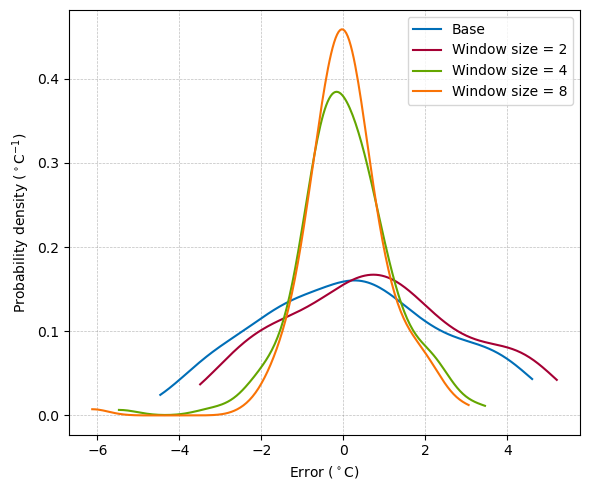

In [107]:
kde_vals, bin_centers = kde(kde_errors, labels=["Base", "Window size = 2", "Window size = 4", "Window size = 8"], plt_title="")


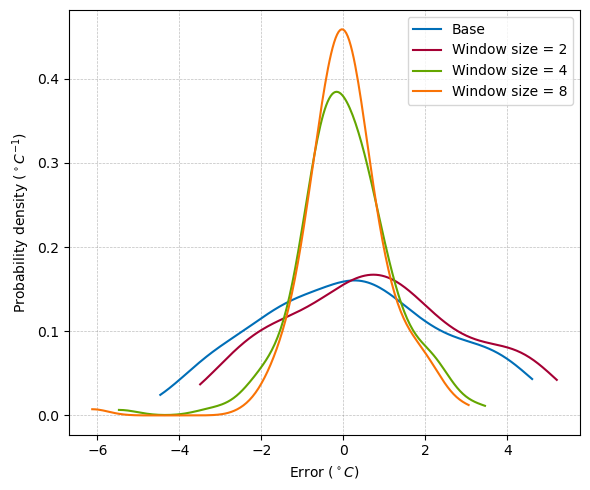

In [111]:
fig, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
labels = ["Base", "Window size = 2", "Window size = 4", "Window size = 8"]
for i in range(4):
    ax.plot(bin_centers[i], kde_vals[i], color=plt_colors[i], label=labels[i])
    
ax.grid()
ax.legend()
ax.set_xlabel(r"Error ($^\circ C$)")
ax.set_ylabel(r"Probability density ($^\circ C^{-1}$)")
plt.show()
fig.savefig(f"../report/images/chapter-4/funcube-black-panel-illumination-combined-window-kde.pdf")

In [89]:
stat_errors = np.array(errors)
stat_errors = np.concatenate([base_errors.reshape(1, -1), stat_errors], axis=0).T
steps = np.arange(0, 11)
mu = np.mean(stat_errors, axis=0)
sigma = np.std(stat_errors, axis=0)
    

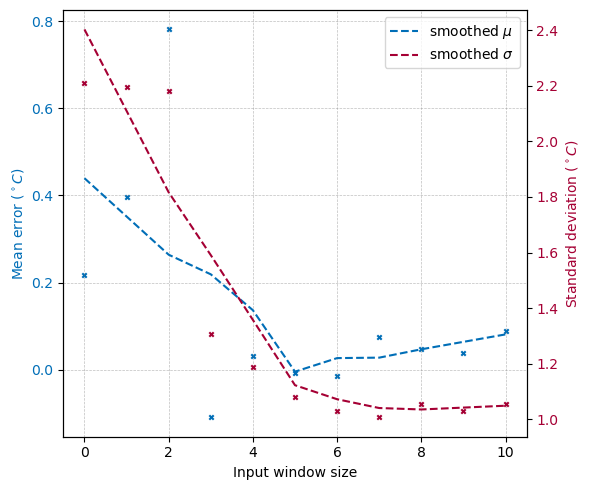

In [112]:
from scipy.signal import savgol_filter
fig, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
ax.scatter(steps, mu, s=10, color=plt_colors[0], marker="x")
# smoothed line
ax.plot(steps, savgol_filter(mu, 5, 1), color=plt_colors[0], linestyle="--", label="smoothed $\mu$")
twin_ax = ax.twinx()
twin_ax.scatter(steps, sigma, s=10, color=plt_colors[1], marker="x")
# smoothed line
twin_ax.plot(steps, savgol_filter(sigma, 5, 1), color=plt_colors[1], linestyle="--", label="smoothed $\sigma$")

# combine legends
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = twin_ax.get_legend_handles_labels()
ax.legend(lines + lines2, labels + labels2, loc=0)
ax.set_ylabel(r"Mean error ($^\circ C$)", color=plt_colors[0])
twin_ax.set_ylabel(r"Standard deviation ($^\circ C$)", color=plt_colors[1])
ax.tick_params(axis="y", labelcolor=plt_colors[0])
twin_ax.tick_params(axis="y", labelcolor=plt_colors[1])
ax.set_xlabel("Input window size")
ax.grid()

plt.show()
fig.savefig(f"../report/images/chapter-4/funcube-black-panel-illumination-combined-window-stats.pdf")

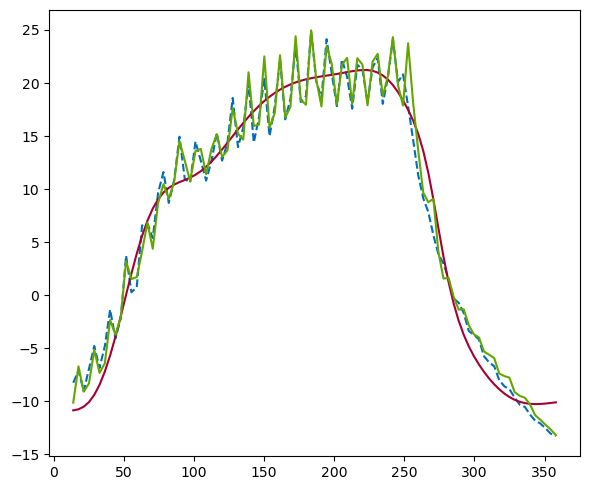

In [40]:
try:
    start_index = test_window_df[test_window_df["theta_T"] == test_norm_df["theta_T (deg)"][94]].index[0]
except:
    start_index = 0
        
end_index = test_window_df[test_window_df["theta_T"] == test_norm_df["theta_T (deg)"][190]].index[0]


fig, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
ax.plot(theta_T[start_index:end_index], actual[start_index:end_index], color=plt_colors[0], label="Actual", linestyle="--")
ax.plot(theta_T[start_index:end_index], base_preds[start_index:end_index], color=plt_colors[1], label="Base Model")
ax.plot(theta_T[start_index:end_index], combined_preds[start_index:end_index], color=plt_colors[2], label="Combined Model")
plt.show()

Epoch 1/5000
9/9 [==============================] - 4s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0574 - val_loss: 0.0021 - val_mean_absolute_error: 0.0380
Epoch 2/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0074 - mean_absolute_error: 0.0572 - val_loss: 0.0021 - val_mean_absolute_error: 0.0378
Epoch 3/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0074 - mean_absolute_error: 0.0569 - val_loss: 0.0021 - val_mean_absolute_error: 0.0376
Epoch 4/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0073 - mean_absolute_error: 0.0566 - val_loss: 0.0021 - val_mean_absolute_error: 0.0374
Epoch 5/5000
9/9 [==============================] - 0s 10ms/step - loss: 0.0073 - mean_absolute_error: 0.0563 - val_loss: 0.0021 - val_mean_absolute_error: 0.0374
Epoch 6/5000
9/9 [==============================] - 0s 11ms/step - loss: 0.0072 - mean_absolute_error: 0.0562 - val_loss: 0.0021 - val_mean_absolute_error: 0.0373
Epoch 7/5000
9/9 [====

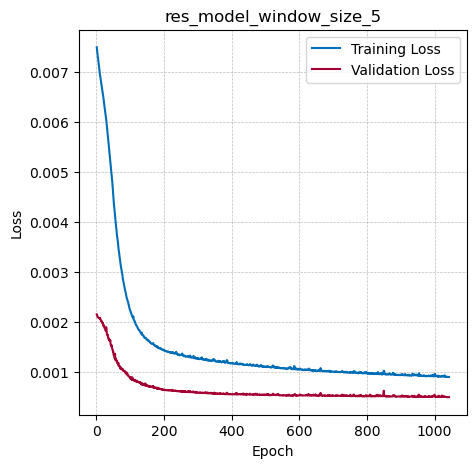

In [22]:
train_window_res_df, train_res_x, train_res_y = window_data_res_illumination(train_norm_df, 96, base_model.model, 5)
test_window_res_df, test_res_x, test_res_y = window_data_res_illumination(test_norm_df, 96, base_model.model, 5)

res_model = Model(train_res_x, train_res_y, test_res_x, test_res_y, name=f"res_model_window_size_5")
res_model.create_model(
    res_model_layers,
    tf.keras.optimizers.Adam(learning_rate=1e-5),
    tf.keras.losses.MeanSquaredError(),
    tf.keras.metrics.MeanAbsoluteError(),
    input_shape=(6,),
    output_shape=1,
)

res_model.train_model(epochs=5000, callbacks=early_stopping)

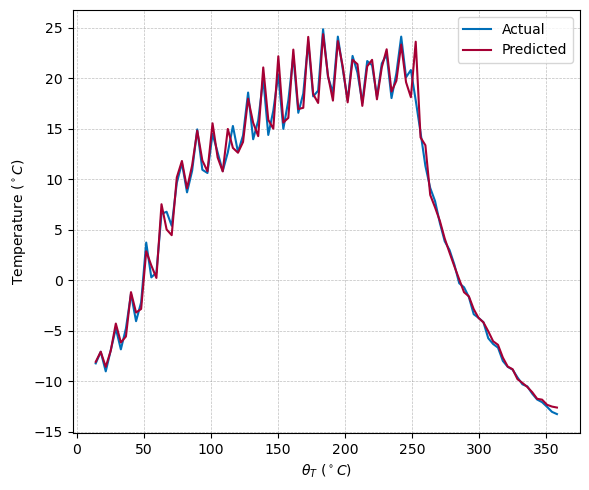

In [23]:
base_model_preds = base_model.model.predict(test_x, verbose=0).flatten()
res_preds = res_model.model.predict(test_res_x, verbose=0).flatten()
combined_preds = denormalize_temperature(base_model_preds + res_preds, norm_limits)

theta_T = test_window_df.iloc[:, 0].to_numpy()
actual = test_y
preds = base_model.model.predict(test_x, verbose=0).flatten()
actual = denormalize_temperature(actual, norm_limits)
try:
    start_index = test_window_df[test_window_df["theta_T"] == test_norm_df["theta_T (deg)"][94]].index[0]
except:
    start_index = 0
        
end_index = test_window_df[test_window_df["theta_T"] == test_norm_df["theta_T (deg)"][190]].index[0]
fig, ax = plt.subplots(figsize=(6, 5), tight_layout=True)
ax.plot(theta_T[start_index:end_index], actual[start_index:end_index], color=plt_colors[0], label="Actual")
ax.plot(theta_T[start_index:end_index], combined_preds[start_index:end_index], color=plt_colors[1], label="Predicted")
ax.set_xlabel(r"$\theta_T$ ($^\circ C$)")
ax.set_ylabel(r"Temperature ($^\circ C$)")
ax.legend()
ax.grid()

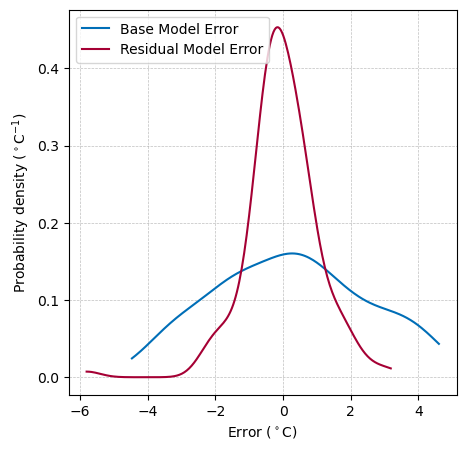

In [24]:
res_errors = (actual - combined_preds).reshape(-1, 1)
errors = (np.array([base_errors, res_errors]).T).reshape(-1, 2)
_ = kde(errors, labels=["Base Model Error", "Residual Model Error"], plt_title="")